# 1) Background

This is our main notebook to train the model and test within our neuromodulated system with goal-driven perception with uncertain goal identity and uncertain goal validity. 

We have modified the PyTorch implementation of EB and c-EB by Sam Greydanus (https://github.com/greydanus/excitationbp/). The code script utils.py in the current directory was modified from his package based on our own network architecture. The two code scripts including *\__*init*\__*.py in the current directory and eb_linear.py in the subdirectory called functions were directly from his package. All the rest code scripts (including load_mnist_data_pair.py, define_model.py, predict_w_cEB.py, train_n_test_model.py, show_cEB_results.py, and regulate_MNIST_pair_uncertainty.py) and two ipython notebook files (including train_n_test_results.ipynb and neuromodulated_goal_driven_perception_results.ipynb) in this entire folder were written completely by us for this project. 

For an in-depth explanation of EB and c-EB, refer to [this paper](https://arxiv.org/abs/1608.00507). Their [original code](https://github.com/jimmie33/Caffe-ExcitationBP) of EB and c-EB is in Caffe.

This ipython notebook was completely written by us, who are anonymous authors of the submitted paper under review.

In [1]:
import torch
import numpy as np
import os, sys, copy ; sys.path.append('..')
from train_n_test_model import train_model
from predict_w_cEB import get_each_ceb_accuracy
from show_cEB_results import print_all_overall_stats, show_cEB_example
from regulate_MNIST_pair_uncertainty import MNIST_uncertainty_task, plot_MNIST_uncertainty, average_probs

reseed = lambda: np.random.seed(seed=1) ; ms = torch.manual_seed(1) # for reproducibility
reseed()

if torch.cuda.is_available():
    useCuda = True
else:
    useCuda = False

print(useCuda)

True


# 2) Train the model

In [2]:
model, dataloader = train_model(total_steps = 4400,test_every = 200,test_pair_num = 2000,toTest = False)


Start to train 4400 steps, each with 256 all-combination pairs.


# 4) Neuromodulated goal-driven perception with uncertainties
Part 4 directly follows Part 2. Part 3, which is independent of Part 4, is in the other ipython notebook file named train_n_test_results.ipynb in the same directory.

In [3]:
ACH_CORRECT=1.20
ACH_INCORRECT=0.85
NE_INCORRECT=1.10
NE_CORRECT=0.85
trialRange=30
trialInterval=400
num_considered=10
num_threshold=8
hasAChLesion=False
hasNELesion=False

## 4.1: Single Valid Cue
Randomly change trial interval within the range (200+/-20) and have a single valid cue for each cue switch, and use one of the validity options: 0.99, 0.85, 0.70

In [4]:
alterValid=False

### 4.1.1: validity_choices=0.99

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
41/4003 = 1.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
544/4003 = 13.6% trials occurred when the predicted digit did not match the cued digit.
    373/4003 trials occurred when the predicted digit did not match the guess-target digit.
    190/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3418/4003 = 85.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [13 30 29 38 33 28 41 31 33 29], and mean of lag length (excluding consistently same cue) is 32.44444444444444


/home/xinyunz5/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


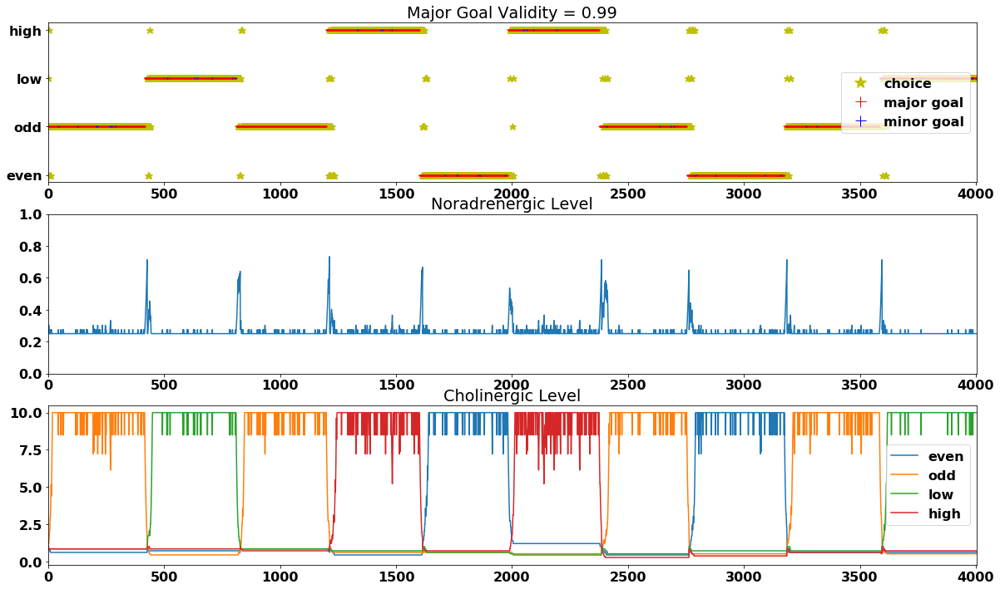

In [5]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_cues=np.array([1,2,1,3,0,3,1,0,1,2]),hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
37/4003 = 0.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
537/4003 = 13.4% trials occurred when the predicted digit did not match the cued digit.
    375/4003 trials occurred when the predicted digit did not match the guess-target digit.
    182/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3429/4003 = 85.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [22 29 20 20 40 18 35 26 32 30], and mean of lag length (excluding consistently same cue) is 27.77777777777778


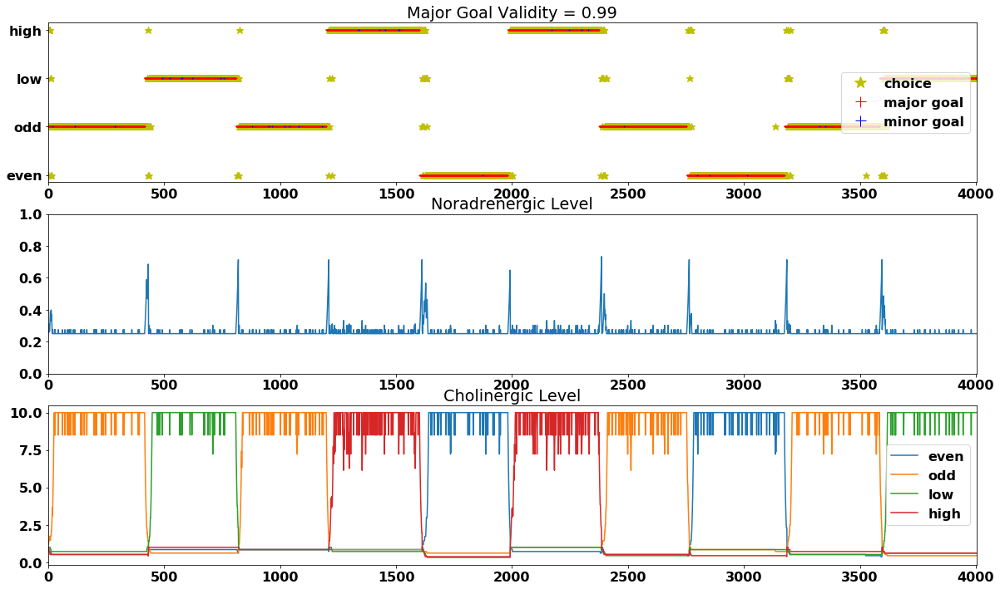

In [6]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
25/4003 = 0.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
524/4003 = 13.1% trials occurred when the predicted digit did not match the cued digit.
    350/4003 trials occurred when the predicted digit did not match the guess-target digit.
    194/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3454/4003 = 86.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [22 30 32 38 33 45 28 41 32 24], and mean of lag length (excluding consistently same cue) is 33.666666666666664


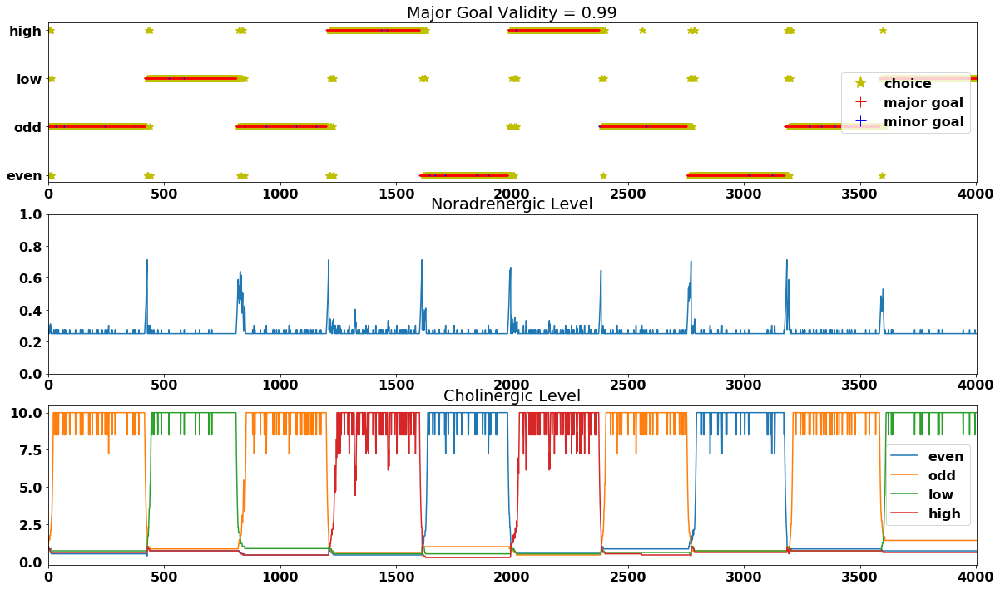

In [7]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
32/4003 = 0.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
538/4003 = 13.4% trials occurred when the predicted digit did not match the cued digit.
    327/4003 trials occurred when the predicted digit did not match the guess-target digit.
    228/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3433/4003 = 85.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [24 34 30 38 29 29 56 29 34 26], and mean of lag length (excluding consistently same cue) is 33.888888888888886


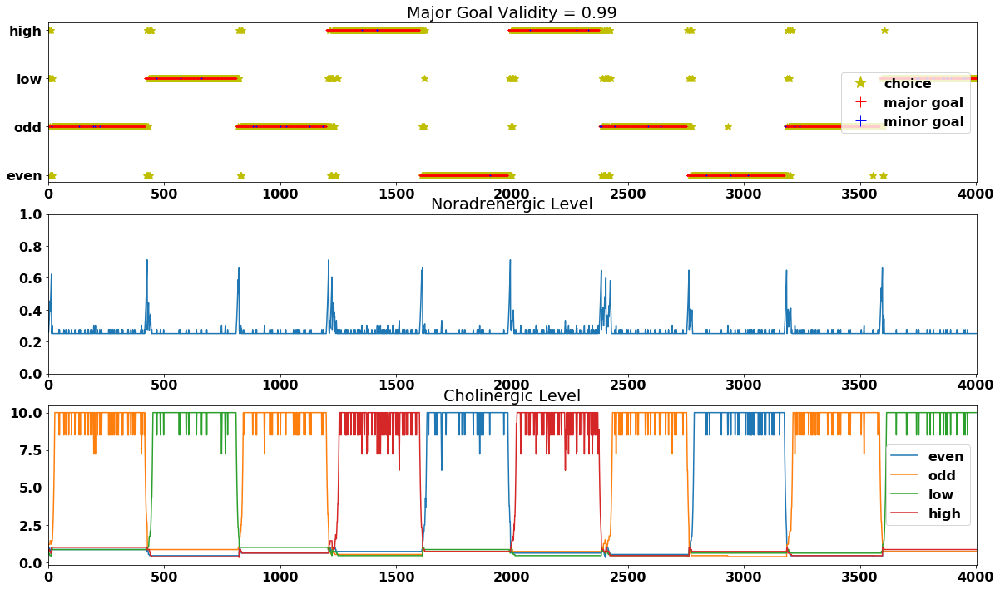

In [8]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
29/4003 = 0.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
598/4003 = 14.9% trials occurred when the predicted digit did not match the cued digit.
    380/4003 trials occurred when the predicted digit did not match the guess-target digit.
    241/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3376/4003 = 84.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [18 73 39 32 26 28 28 26 41 42], and mean of lag length (excluding consistently same cue) is 37.22222222222222


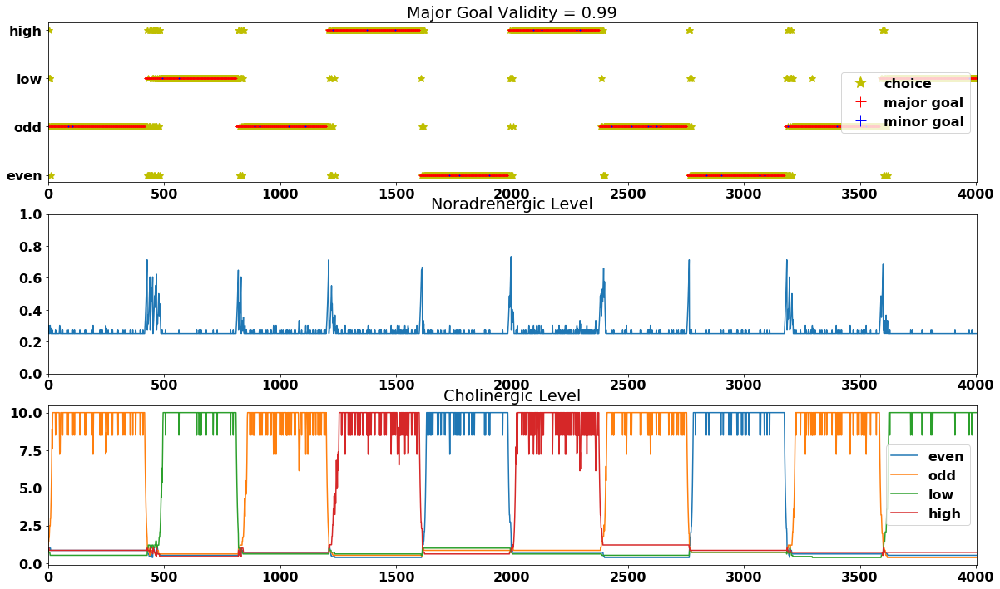

In [9]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
30/4003 = 0.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
559/4003 = 14.0% trials occurred when the predicted digit did not match the cued digit.
    367/4003 trials occurred when the predicted digit did not match the guess-target digit.
    218/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3414/4003 = 85.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [30 30 52 25 41 27 33 26 30 27], and mean of lag length (excluding consistently same cue) is 32.333333333333336


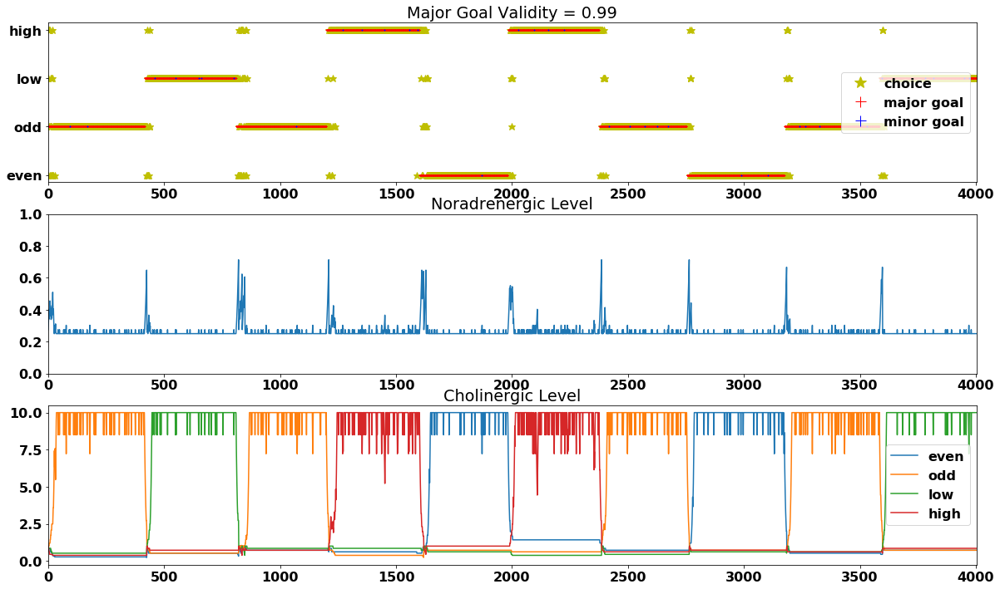

In [10]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
40/4003 = 1.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
574/4003 = 14.3% trials occurred when the predicted digit did not match the cued digit.
    381/4003 trials occurred when the predicted digit did not match the guess-target digit.
    216/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3389/4003 = 84.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [30 28 49 26 35 29 30 37 30 26], and mean of lag length (excluding consistently same cue) is 32.22222222222222


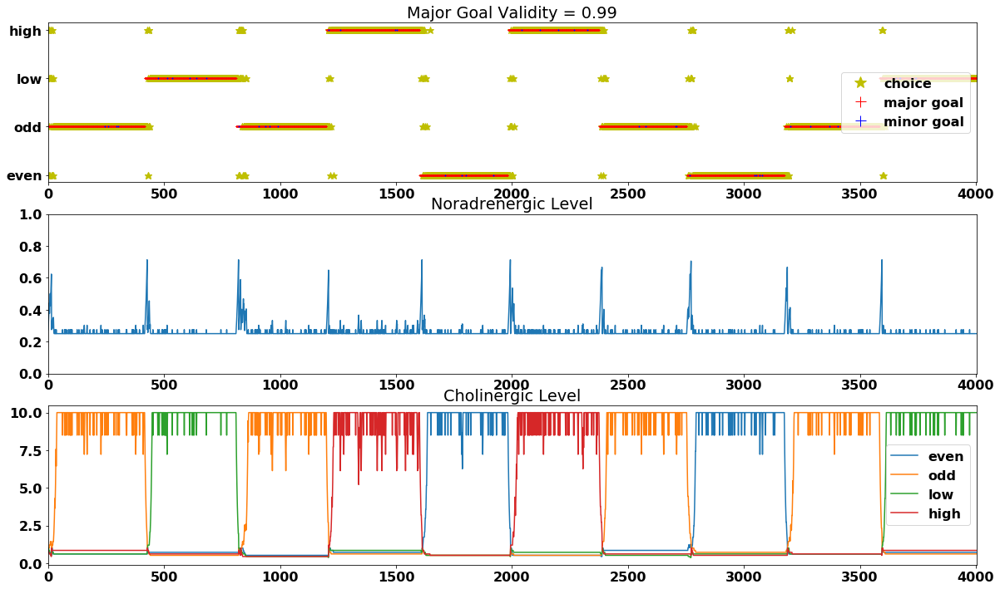

In [11]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
37/4003 = 0.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
559/4003 = 14.0% trials occurred when the predicted digit did not match the cued digit.
    345/4003 trials occurred when the predicted digit did not match the guess-target digit.
    233/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3407/4003 = 85.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [19 37 68 43 31 44 32 33 24 36], and mean of lag length (excluding consistently same cue) is 38.666666666666664


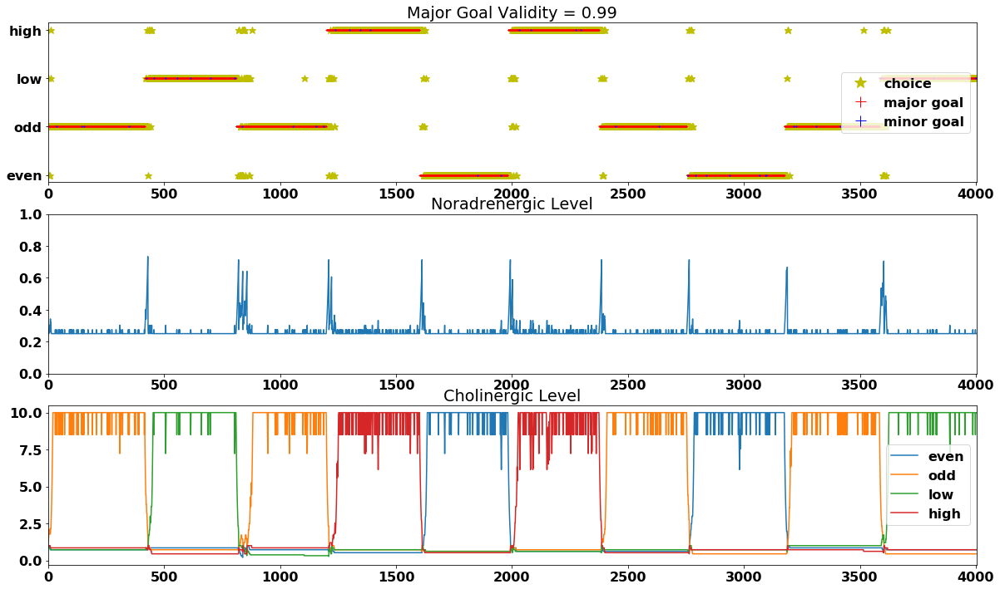

In [12]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
27/4003 = 0.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
581/4003 = 14.5% trials occurred when the predicted digit did not match the cued digit.
    363/4003 trials occurred when the predicted digit did not match the guess-target digit.
    238/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3395/4003 = 84.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [24 30 39 43 39 40 31 31 39 31], and mean of lag length (excluding consistently same cue) is 35.888888888888886


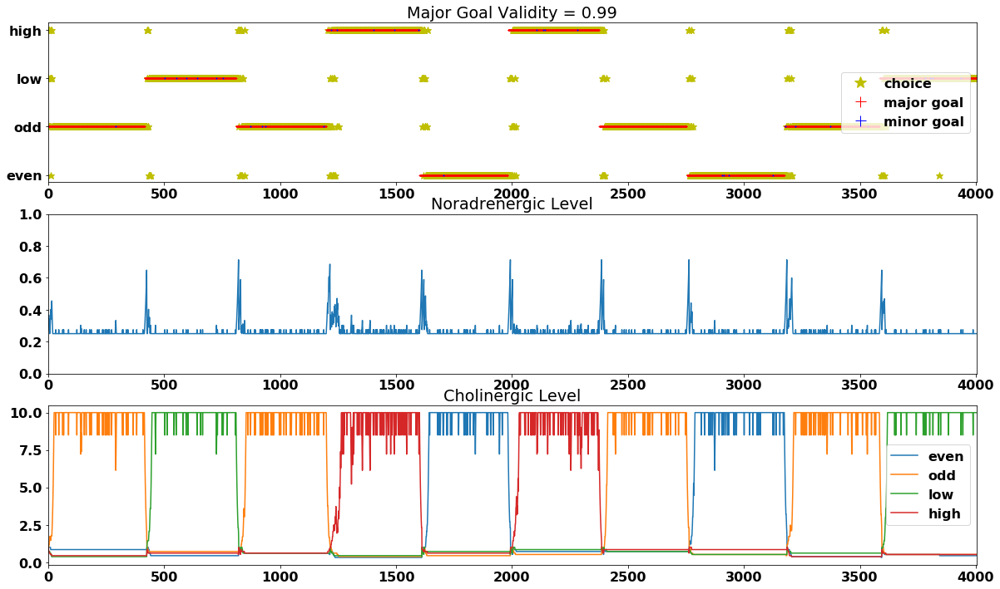

In [13]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
40/4003 = 1.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
556/4003 = 13.9% trials occurred when the predicted digit did not match the cued digit.
    350/4003 trials occurred when the predicted digit did not match the guess-target digit.
    220/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3407/4003 = 85.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [20 34 53 47 25 35 31 24 39 39], and mean of lag length (excluding consistently same cue) is 36.333333333333336


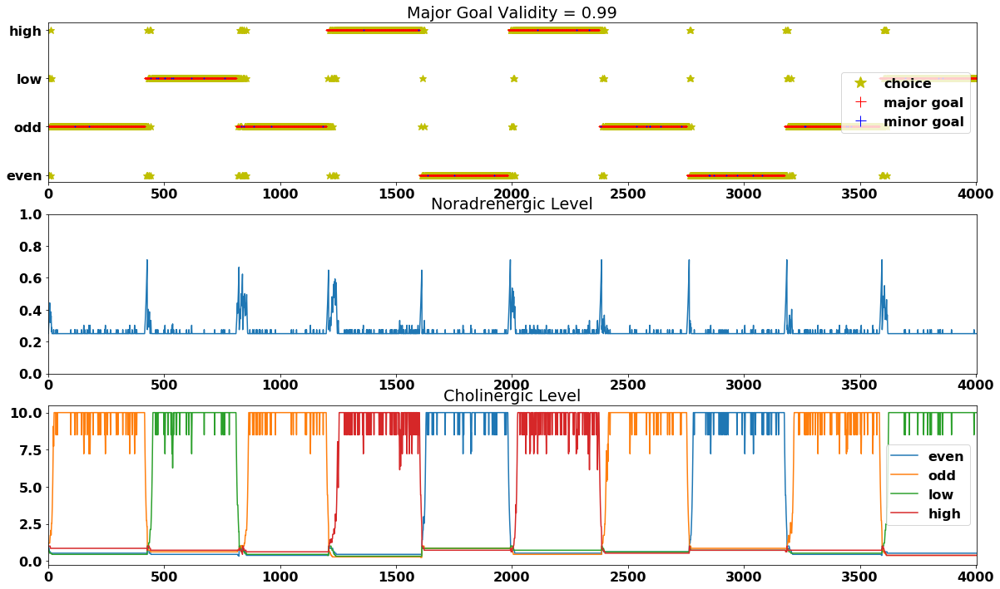

In [14]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


In [15]:
all_99_case_probs = [all_prob_99_1,all_prob_99_2,all_prob_99_3,all_prob_99_4,all_prob_99_5,\
                     all_prob_99_6,all_prob_99_7,all_prob_99_8,all_prob_99_9,all_prob_99_10]
averages_99 = average_probs(all_99_case_probs)


Average lag length is: 34
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.13914564076942293, 0.8524106919810143, 0.0, 0.008443667249562827, 0.05395953035223583, 0.09020734449163129, 0.0]


### 4.1.2: validity_choices=0.85

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
465/4003 = 11.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
688/4003 = 17.2% trials occurred when the predicted digit did not match the cued digit.
    356/4003 trials occurred when the predicted digit did not match the guess-target digit.
    367/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2850/4003 = 71.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 22  30  30 187  32  62  41  69  38  37], and mean of lag length (excluding consistently same cue) is 58.44444444444444


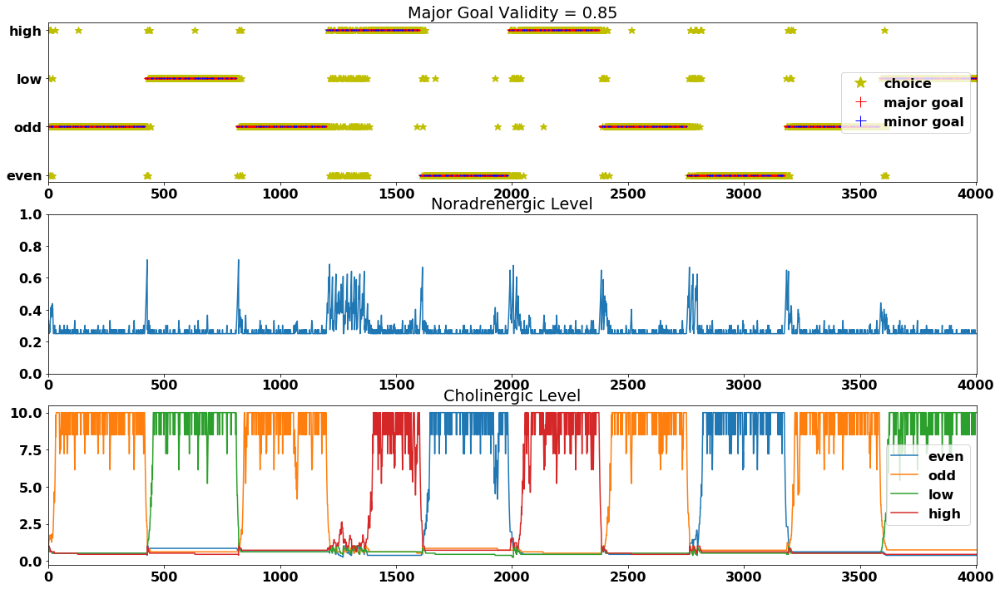

In [16]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
467/4003 = 11.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
748/4003 = 18.7% trials occurred when the predicted digit did not match the cued digit.
    389/4003 trials occurred when the predicted digit did not match the guess-target digit.
    387/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2788/4003 = 69.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [38 55 35 86 46 65 64 49 44 35], and mean of lag length (excluding consistently same cue) is 53.22222222222222


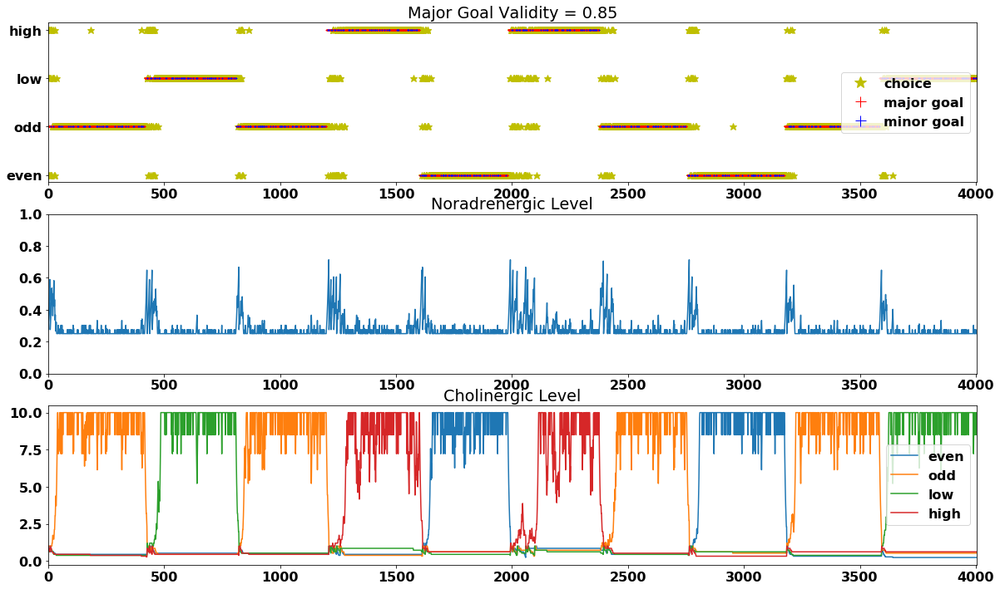

In [17]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
542/4003 = 13.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
617/4003 = 15.4% trials occurred when the predicted digit did not match the cued digit.
    365/4003 trials occurred when the predicted digit did not match the guess-target digit.
    280/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2844/4003 = 71.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [35 65 32 31 41 34 37 29 54 40], and mean of lag length (excluding consistently same cue) is 40.333333333333336


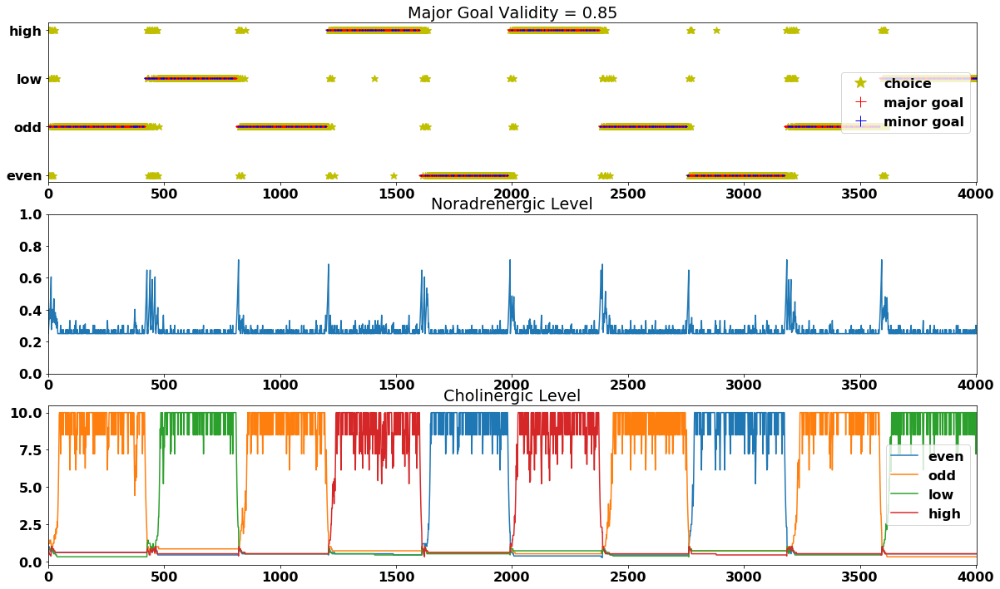

In [18]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
486/4003 = 12.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
565/4003 = 14.1% trials occurred when the predicted digit did not match the cued digit.
    353/4003 trials occurred when the predicted digit did not match the guess-target digit.
    237/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2952/4003 = 73.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [16 36 39 47 28 28 35 70 40 25], and mean of lag length (excluding consistently same cue) is 38.666666666666664


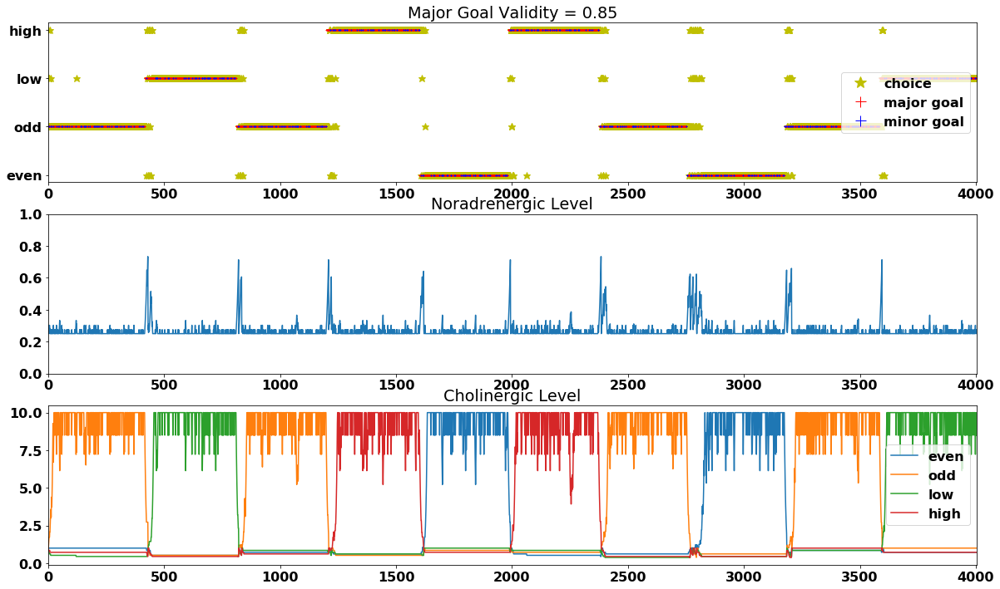

In [19]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
519/4003 = 13.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
577/4003 = 14.4% trials occurred when the predicted digit did not match the cued digit.
    372/4003 trials occurred when the predicted digit did not match the guess-target digit.
    234/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2907/4003 = 72.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [18 38 22 40 32 55 48 41 35 35], and mean of lag length (excluding consistently same cue) is 38.44444444444444


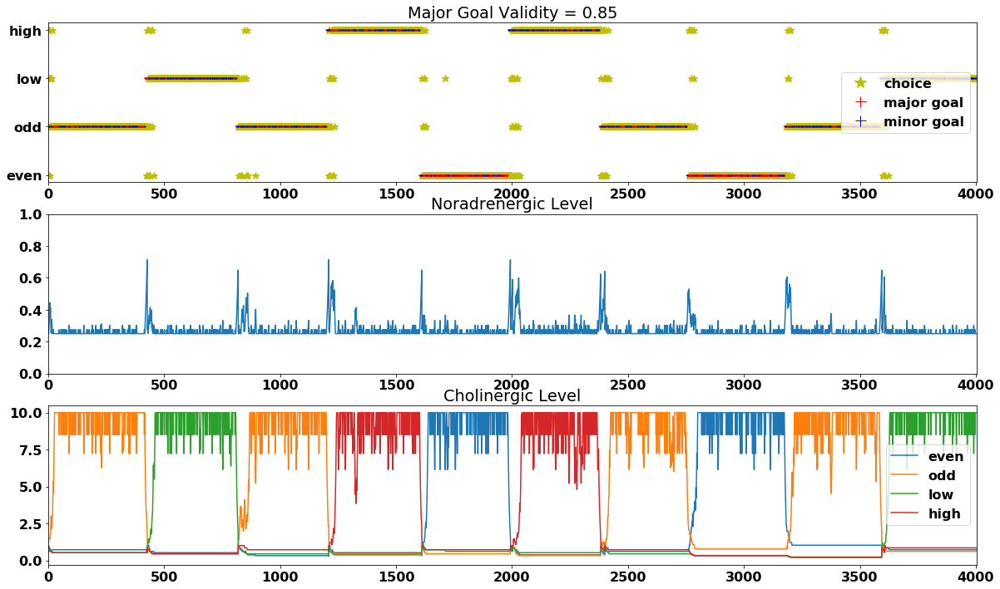

In [20]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
487/4003 = 12.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
720/4003 = 18.0% trials occurred when the predicted digit did not match the cued digit.
    343/4003 trials occurred when the predicted digit did not match the guess-target digit.
    411/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2796/4003 = 69.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 55  99  35 123  65  25  97  29  31  31], and mean of lag length (excluding consistently same cue) is 59.44444444444444


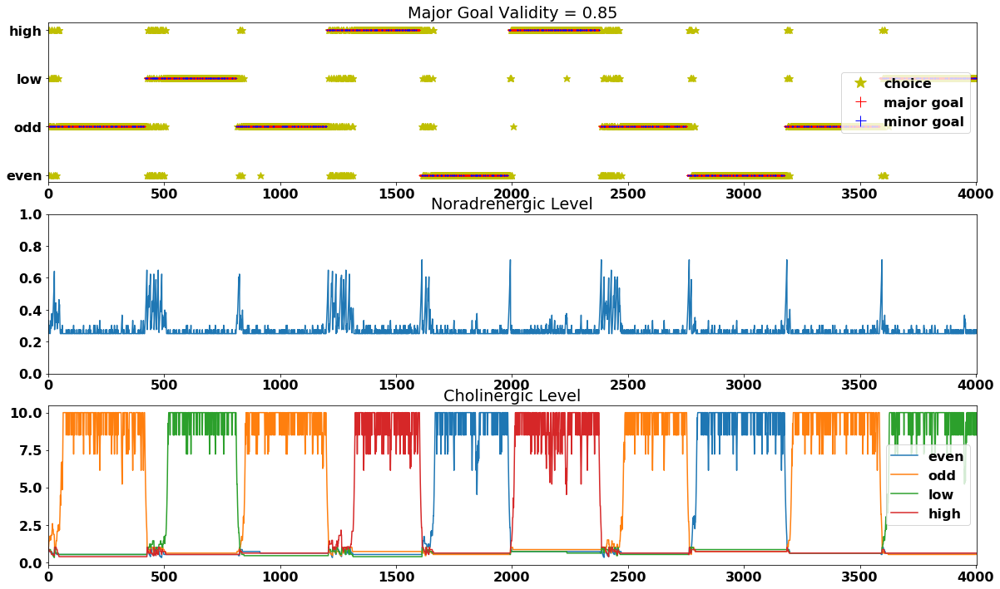

In [21]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
530/4003 = 13.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
536/4003 = 13.4% trials occurred when the predicted digit did not match the cued digit.
    356/4003 trials occurred when the predicted digit did not match the guess-target digit.
    201/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2937/4003 = 73.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [26 30 34 34 33 38 23 26 30 38], and mean of lag length (excluding consistently same cue) is 31.77777777777778


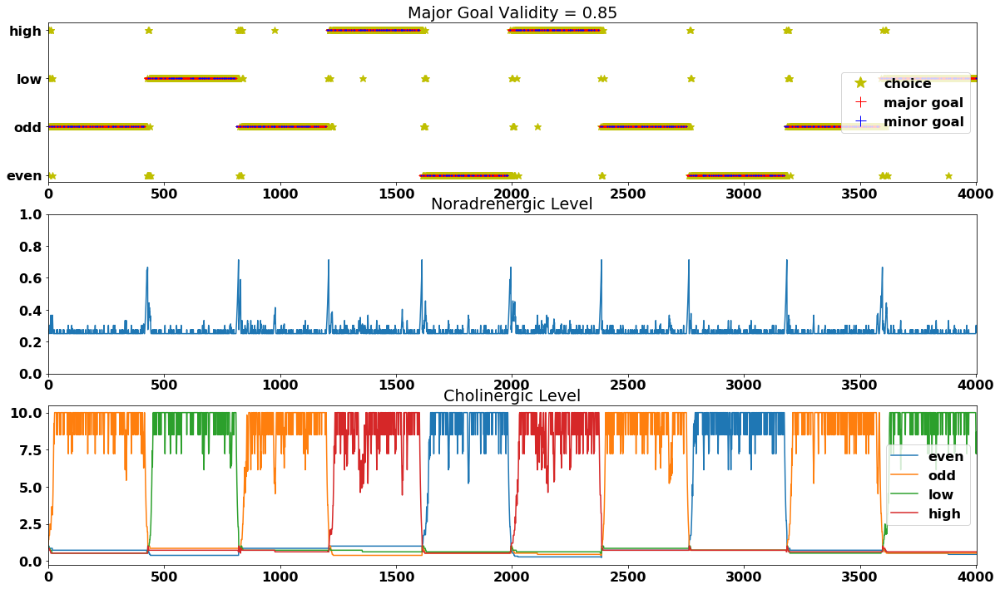

In [22]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
525/4003 = 13.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
629/4003 = 15.7% trials occurred when the predicted digit did not match the cued digit.
    365/4003 trials occurred when the predicted digit did not match the guess-target digit.
    279/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2849/4003 = 71.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [22 45 41 51 56 54 38 34 35 32], and mean of lag length (excluding consistently same cue) is 42.888888888888886


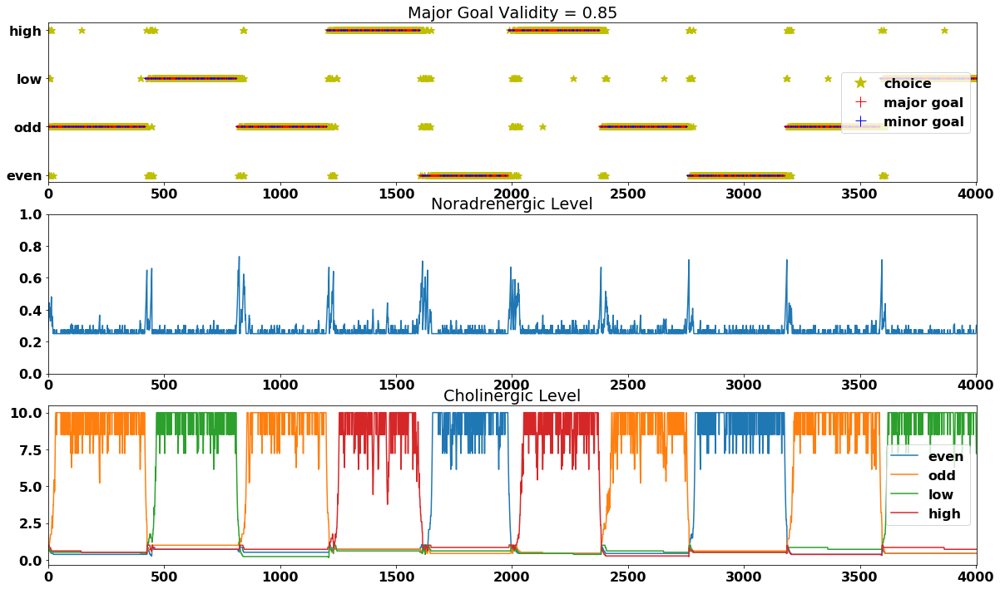

In [23]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
543/4003 = 13.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
548/4003 = 13.7% trials occurred when the predicted digit did not match the cued digit.
    368/4003 trials occurred when the predicted digit did not match the guess-target digit.
    207/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2912/4003 = 72.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [22 21 29 44 39 22 55 24 27 33], and mean of lag length (excluding consistently same cue) is 32.666666666666664


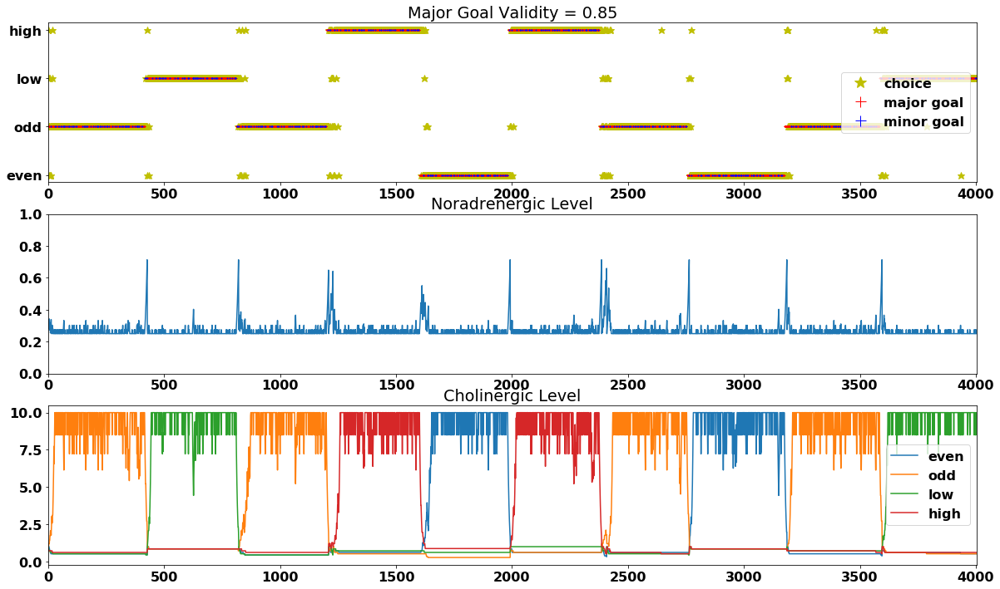

In [24]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
490/4003 = 12.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
576/4003 = 14.4% trials occurred when the predicted digit did not match the cued digit.
    353/4003 trials occurred when the predicted digit did not match the guess-target digit.
    253/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2937/4003 = 73.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [40 47 18 38 37 44 73 28 29 29], and mean of lag length (excluding consistently same cue) is 38.111111111111114


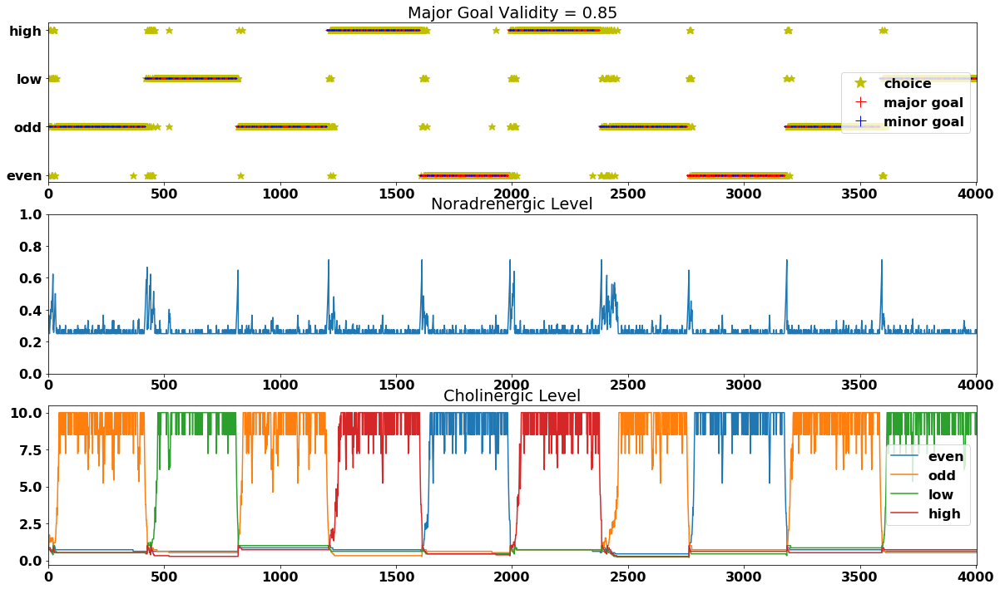

In [25]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


In [26]:
all_85_case_probs = [all_prob_85_1,all_prob_85_2,all_prob_85_3,all_prob_85_4,all_prob_85_5,\
                     all_prob_85_6,all_prob_85_7,all_prob_85_8,all_prob_85_9,all_prob_85_10]
averages_85 = average_probs(all_85_case_probs)


Average lag length is: 43
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.15498376217836624, 0.7187609293030227, 0.0, 0.12625530851861105, 0.07134649013240071, 0.09043217586809893, 0.0]


### 4.1.3: validity_choices=0.7

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
972/4003 = 24.3% trials occurred when the predicted digit matched the cued digit but the cue was invalid
828/4003 = 20.7% trials occurred when the predicted digit did not match the cued digit.
    368/4003 trials occurred when the predicted digit did not match the guess-target digit.
    511/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2203/4003 = 55.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 95  45  21  33  73  35  29  66 107 100], and mean of lag length (excluding consistently same cue) is 56.55555555555556


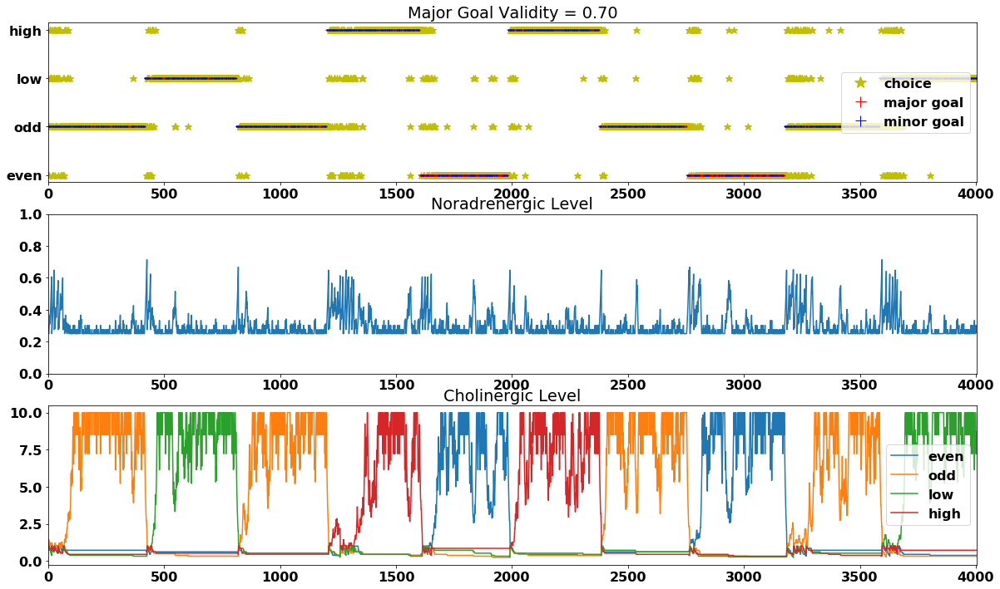

In [27]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
869/4003 = 21.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
961/4003 = 24.0% trials occurred when the predicted digit did not match the cued digit.
    361/4003 trials occurred when the predicted digit did not match the guess-target digit.
    651/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2173/4003 = 54.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 28  86  36  53 111 108  57  52 159  23], and mean of lag length (excluding consistently same cue) is 76.11111111111111


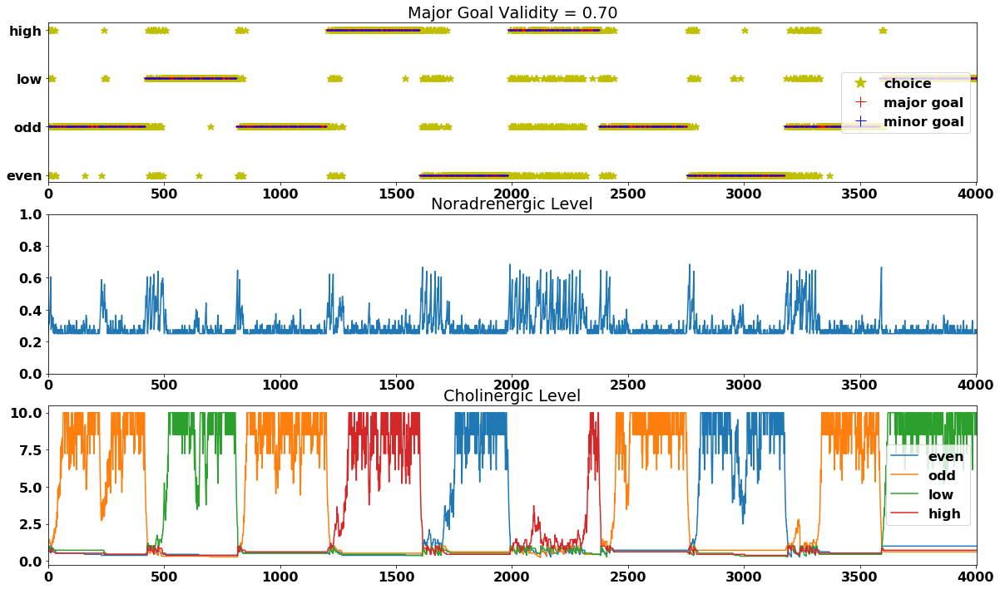

In [28]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
1008/4003 = 25.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
742/4003 = 18.5% trials occurred when the predicted digit did not match the cued digit.
    358/4003 trials occurred when the predicted digit did not match the guess-target digit.
    421/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2253/4003 = 56.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [65 72 42 20 30 53 51 26 96 60], and mean of lag length (excluding consistently same cue) is 50.0


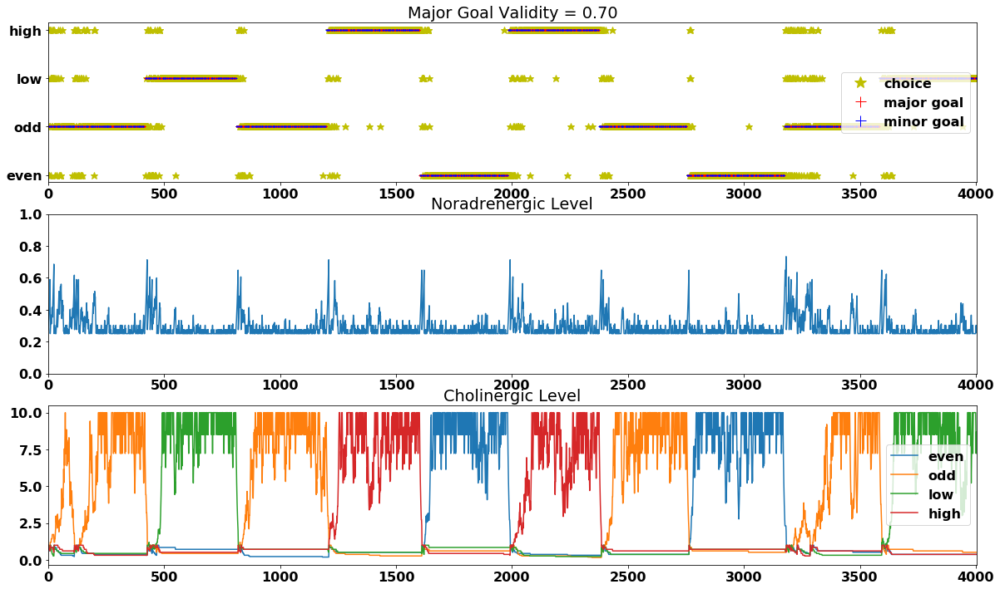

In [29]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
954/4003 = 23.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
951/4003 = 23.8% trials occurred when the predicted digit did not match the cued digit.
    351/4003 trials occurred when the predicted digit did not match the guess-target digit.
    655/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2098/4003 = 52.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 51  44  52  35  45 148  39  29  57  46], and mean of lag length (excluding consistently same cue) is 55.0


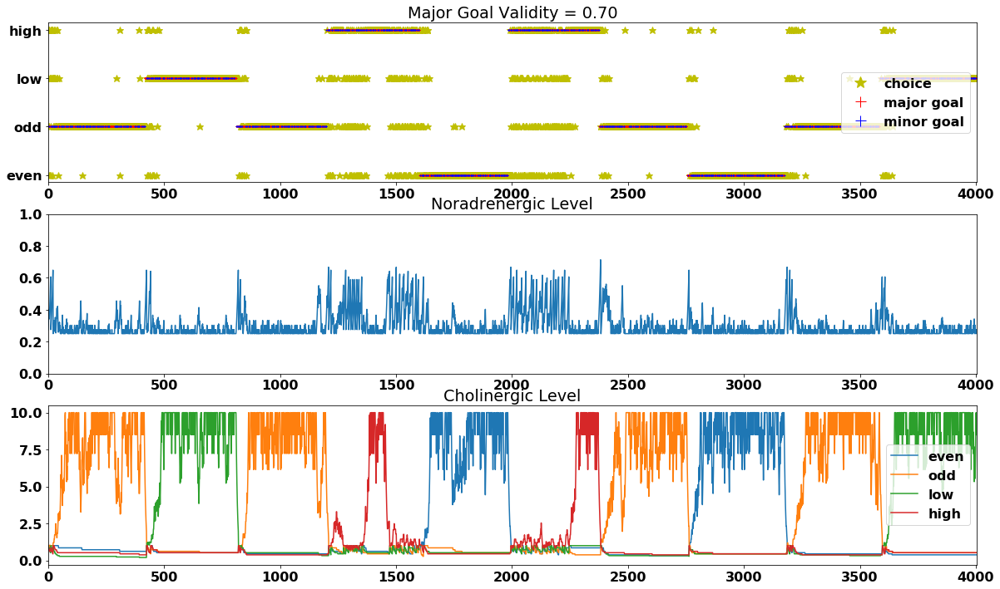

In [30]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
926/4003 = 23.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
821/4003 = 20.5% trials occurred when the predicted digit did not match the cued digit.
    345/4003 trials occurred when the predicted digit did not match the guess-target digit.
    511/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2256/4003 = 56.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 32  50  23 101  54 158  33  51  70  49], and mean of lag length (excluding consistently same cue) is 65.44444444444444


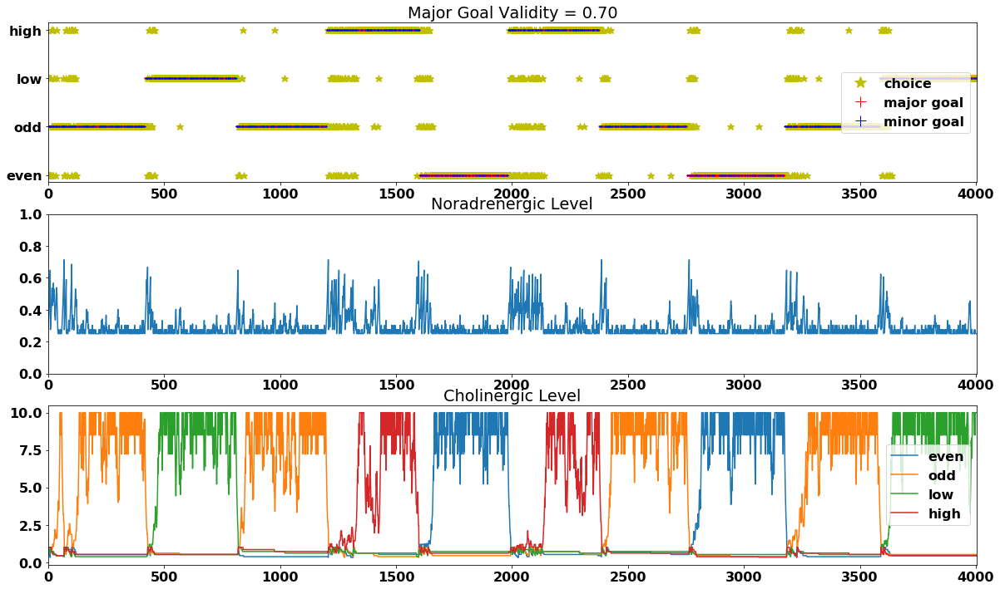

In [31]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
899/4003 = 22.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
991/4003 = 24.8% trials occurred when the predicted digit did not match the cued digit.
    360/4003 trials occurred when the predicted digit did not match the guess-target digit.
    693/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2113/4003 = 52.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 25  29  73 116  53  38  40  40 168  38], and mean of lag length (excluding consistently same cue) is 66.11111111111111


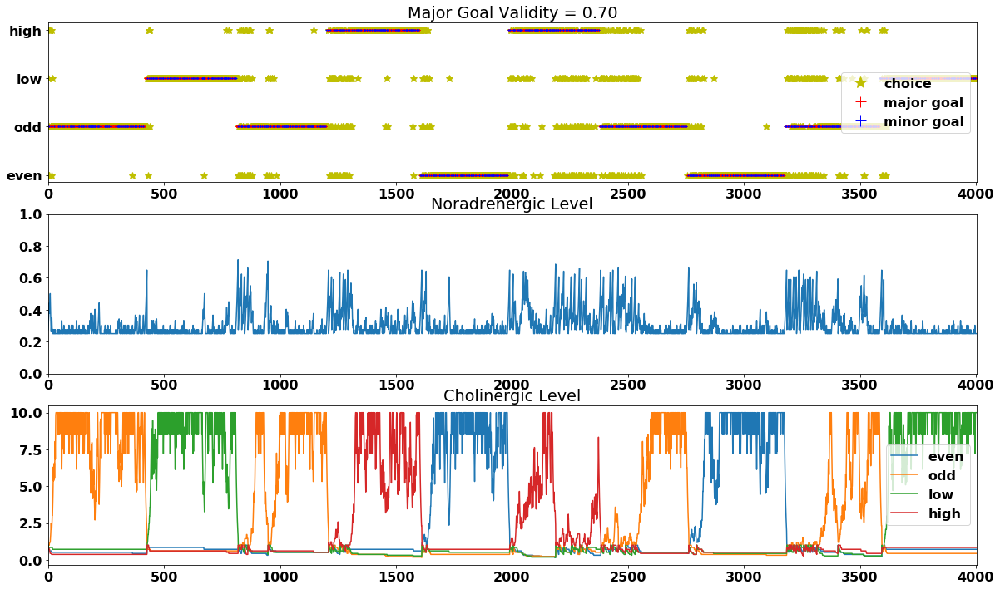

In [32]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
954/4003 = 23.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
814/4003 = 20.3% trials occurred when the predicted digit did not match the cued digit.
    334/4003 trials occurred when the predicted digit did not match the guess-target digit.
    516/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2235/4003 = 55.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 23 145  41  87  69  24  58  43  37  99], and mean of lag length (excluding consistently same cue) is 67.0


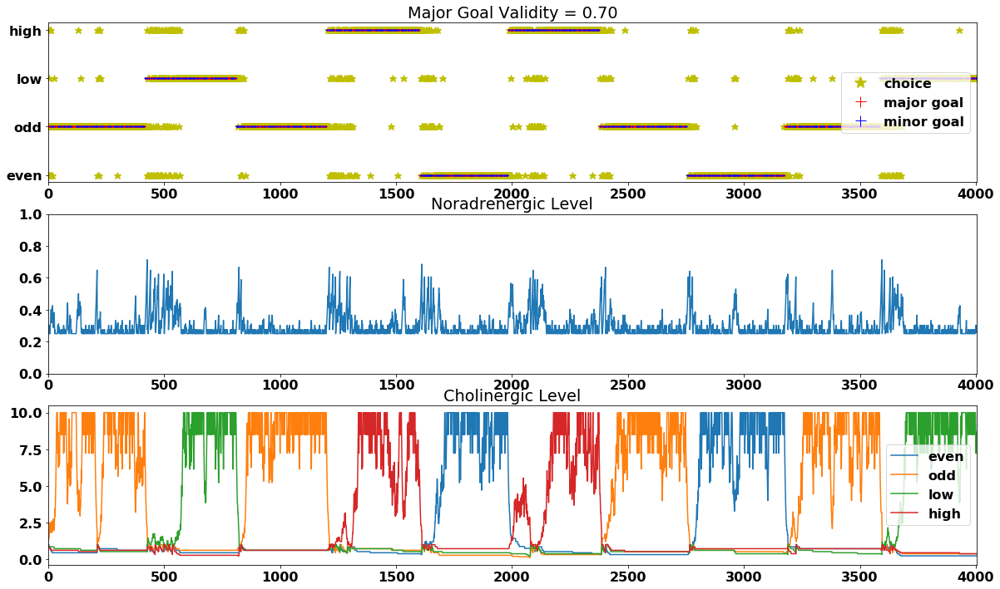

In [33]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
923/4003 = 23.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
814/4003 = 20.3% trials occurred when the predicted digit did not match the cued digit.
    330/4003 trials occurred when the predicted digit did not match the guess-target digit.
    526/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2266/4003 = 56.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 39  28  24 109  49  74  33  53  27 121], and mean of lag length (excluding consistently same cue) is 57.55555555555556


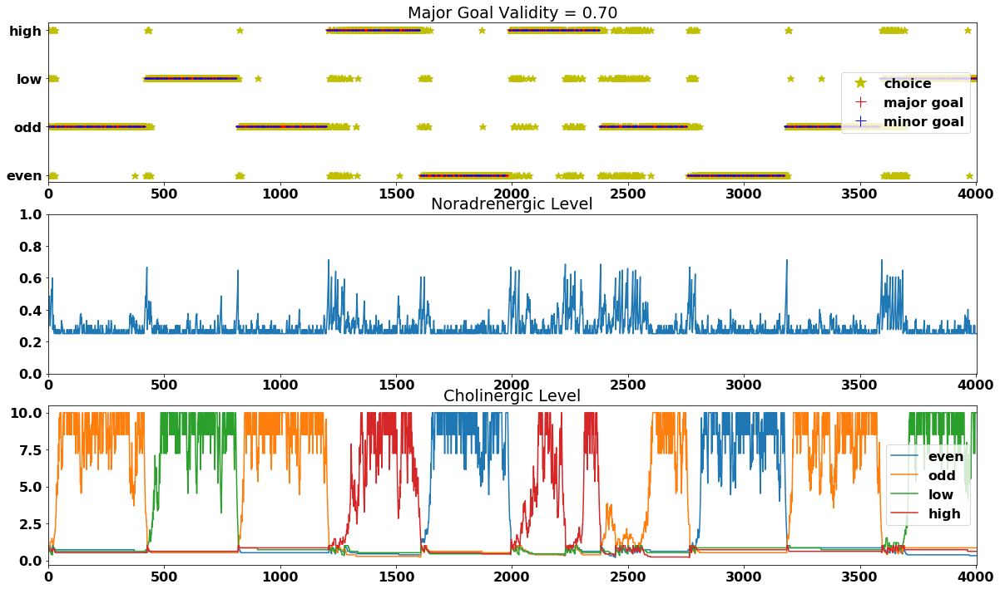

In [34]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
884/4003 = 22.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1041/4003 = 26.0% trials occurred when the predicted digit did not match the cued digit.
    348/4003 trials occurred when the predicted digit did not match the guess-target digit.
    763/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2078/4003 = 51.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 77  55  97  94  75 240  39  72  34 117], and mean of lag length (excluding consistently same cue) is 91.44444444444444


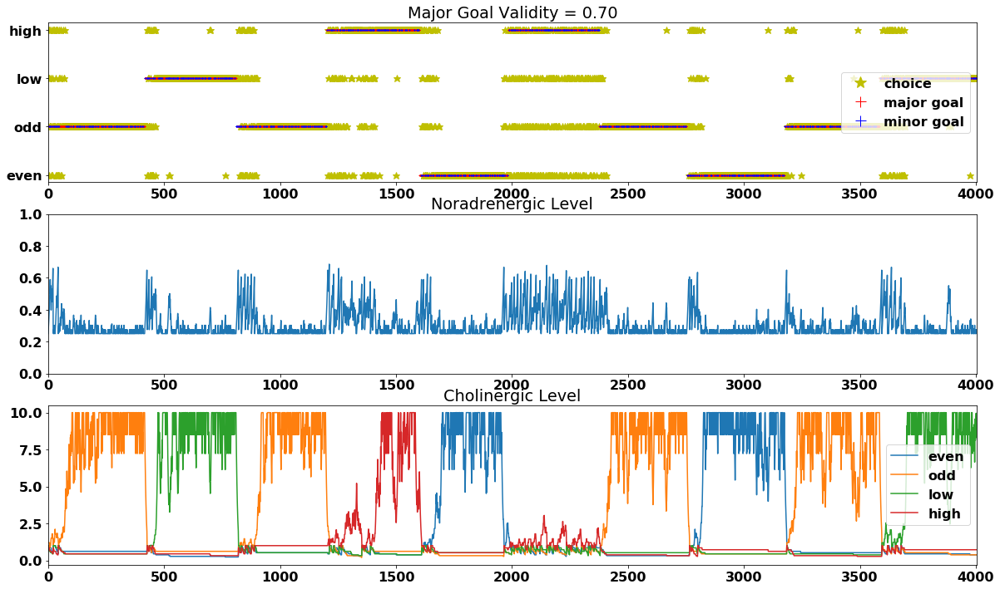

In [35]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
973/4003 = 24.3% trials occurred when the predicted digit matched the cued digit but the cue was invalid
667/4003 = 16.7% trials occurred when the predicted digit did not match the cued digit.
    347/4003 trials occurred when the predicted digit did not match the guess-target digit.
    342/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2363/4003 = 59.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [23 58 33 30 34 37 44 31 34 32], and mean of lag length (excluding consistently same cue) is 37.0


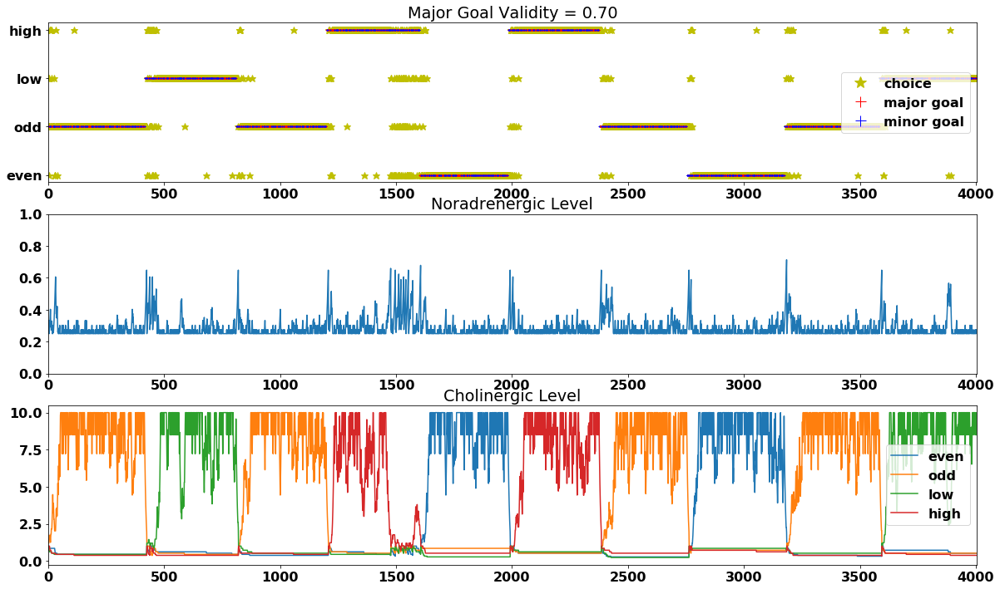

In [36]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


In [37]:
all_70_case_probs = [all_prob_70_1,all_prob_70_2,all_prob_70_3,all_prob_70_4,all_prob_70_5,\
                     all_prob_70_6,all_prob_70_7,all_prob_70_8,all_prob_70_9,all_prob_70_10]
averages_70 = average_probs(all_70_case_probs)


Average lag length is: 62
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.2155883087684237, 0.5505370971771172, 0.0, 0.23387459405445915, 0.1396202847864102, 0.08748438670996753, 0.0]


### 4.1.4: validity_choices=[0.99, 0.85, 0.70]

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
341/4003 = 8.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
662/4003 = 16.5% trials occurred when the predicted digit did not match the cued digit.
    354/4003 trials occurred when the predicted digit did not match the guess-target digit.
    334/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3000/4003 = 74.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [37 39 28 38 34 41 37 38 50 29], and mean of lag length (excluding consistently same cue) is 37.111111111111114


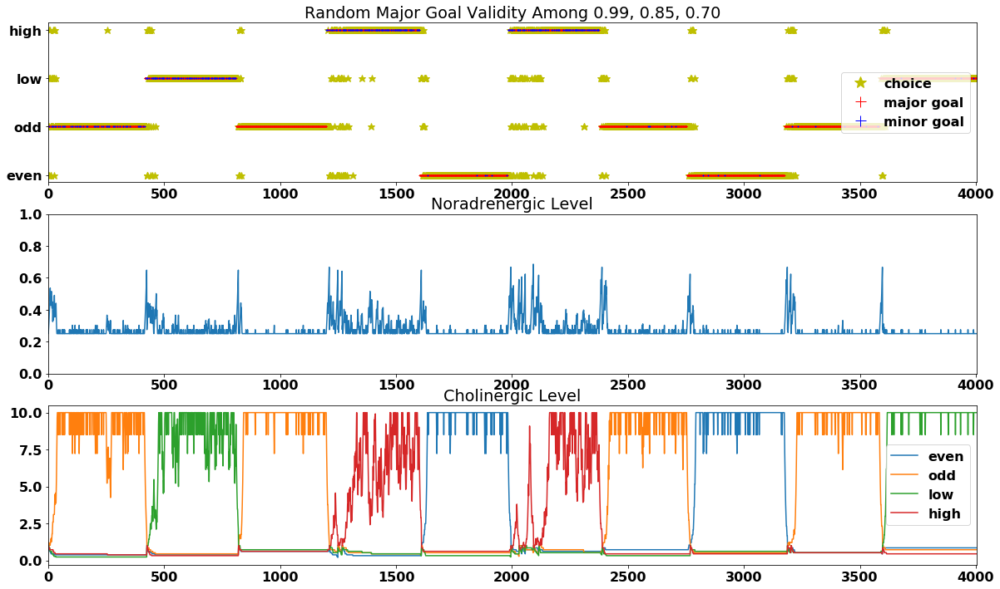

In [38]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
448/4003 = 11.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
714/4003 = 17.8% trials occurred when the predicted digit did not match the cued digit.
    337/4003 trials occurred when the predicted digit did not match the guess-target digit.
    410/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2841/4003 = 71.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 18  34  20  70  45  70 114  33  31  46], and mean of lag length (excluding consistently same cue) is 51.44444444444444


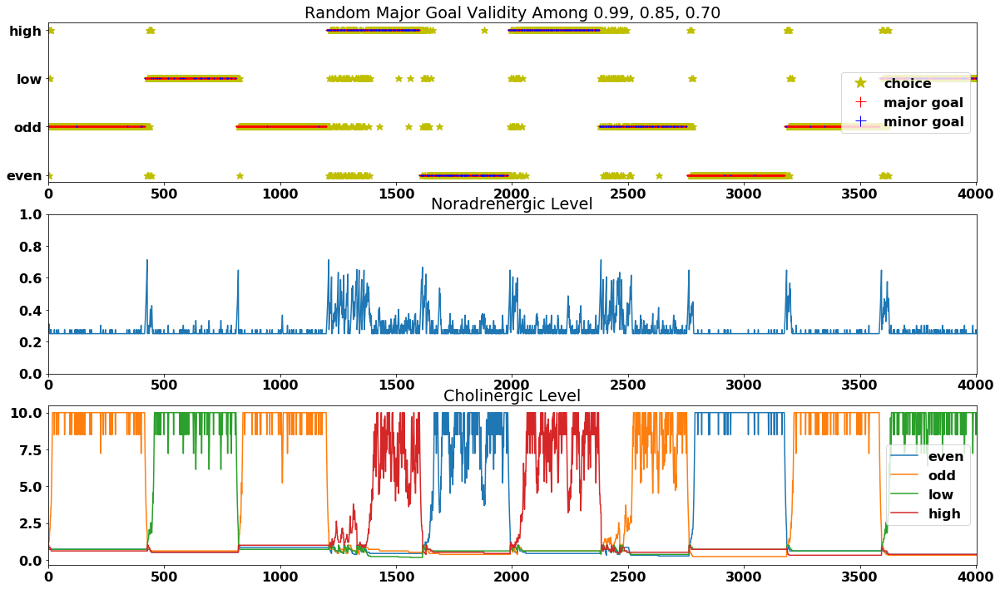

In [39]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
532/4003 = 13.3% trials occurred when the predicted digit matched the cued digit but the cue was invalid
644/4003 = 16.1% trials occurred when the predicted digit did not match the cued digit.
    355/4003 trials occurred when the predicted digit did not match the guess-target digit.
    321/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2827/4003 = 70.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [27 33 33 24 58 83 32 63 63 42], and mean of lag length (excluding consistently same cue) is 47.888888888888886


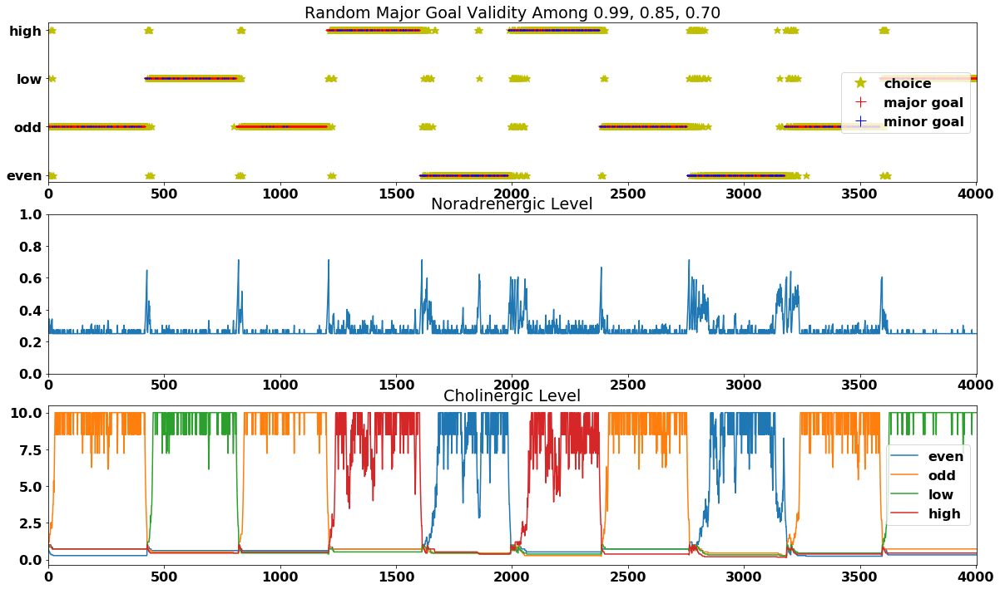

In [40]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
363/4003 = 9.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
645/4003 = 16.1% trials occurred when the predicted digit did not match the cued digit.
    371/4003 trials occurred when the predicted digit did not match the guess-target digit.
    303/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2995/4003 = 74.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [32 69 29 45 38 25 95 33 32 55], and mean of lag length (excluding consistently same cue) is 46.77777777777778


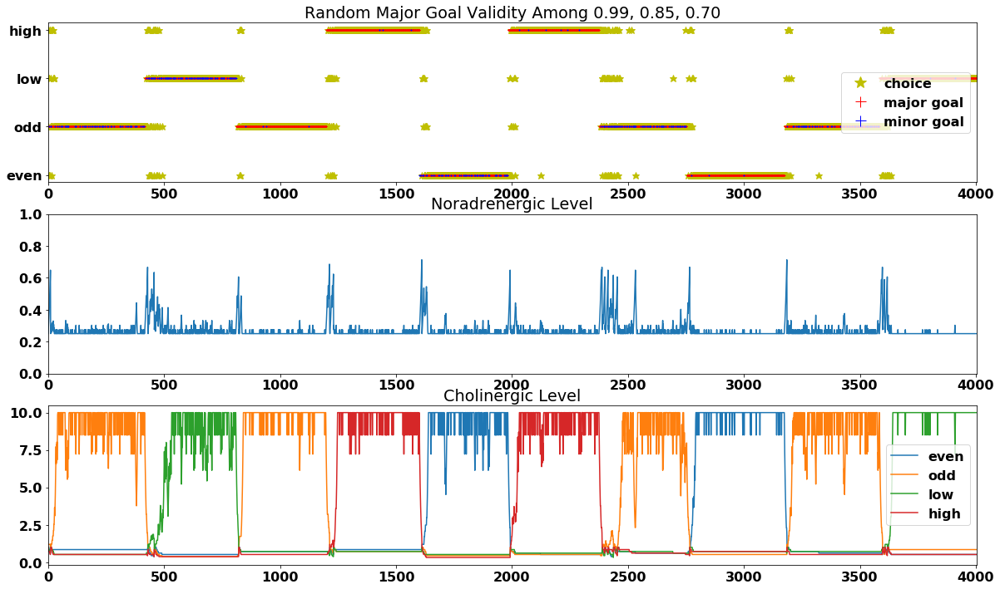

In [41]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
526/4003 = 13.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
768/4003 = 19.2% trials occurred when the predicted digit did not match the cued digit.
    346/4003 trials occurred when the predicted digit did not match the guess-target digit.
    472/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2709/4003 = 67.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [48 40 55 30 65 60 24 78 87 55], and mean of lag length (excluding consistently same cue) is 54.888888888888886


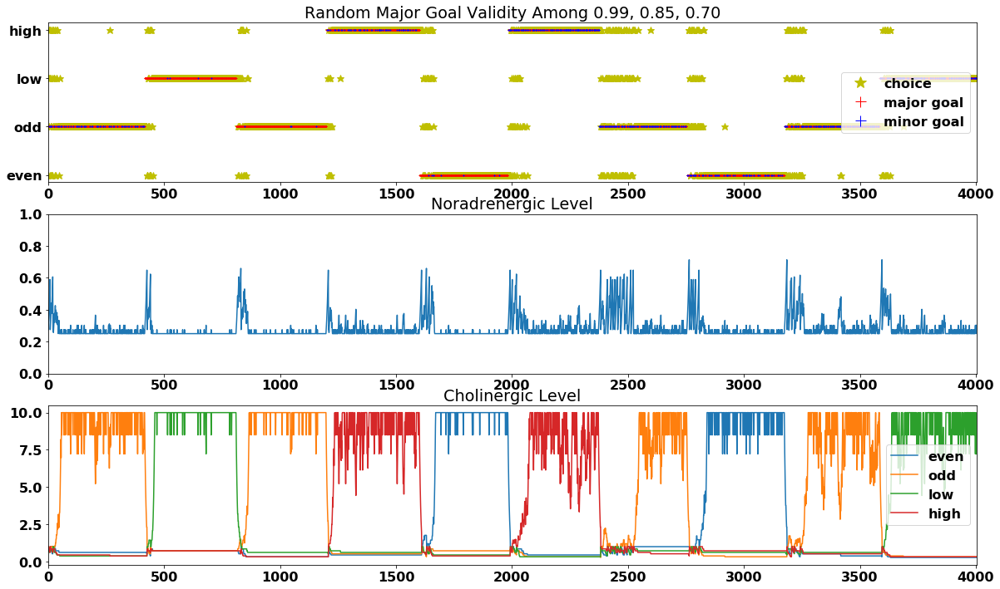

In [42]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
496/4003 = 12.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
682/4003 = 17.0% trials occurred when the predicted digit did not match the cued digit.
    363/4003 trials occurred when the predicted digit did not match the guess-target digit.
    363/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2825/4003 = 70.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 56  23  32  51  38  29  32  47 140  29], and mean of lag length (excluding consistently same cue) is 46.77777777777778


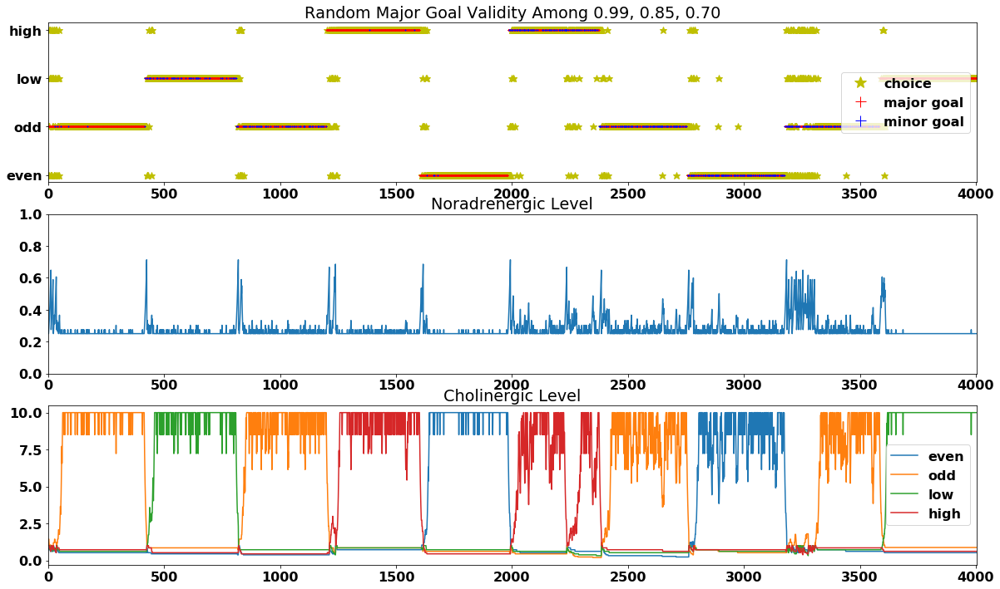

In [43]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
585/4003 = 14.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
558/4003 = 13.9% trials occurred when the predicted digit did not match the cued digit.
    301/4003 trials occurred when the predicted digit did not match the guess-target digit.
    280/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2860/4003 = 71.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [28 38 39 63 49 57 30 39 59 29], and mean of lag length (excluding consistently same cue) is 44.77777777777778


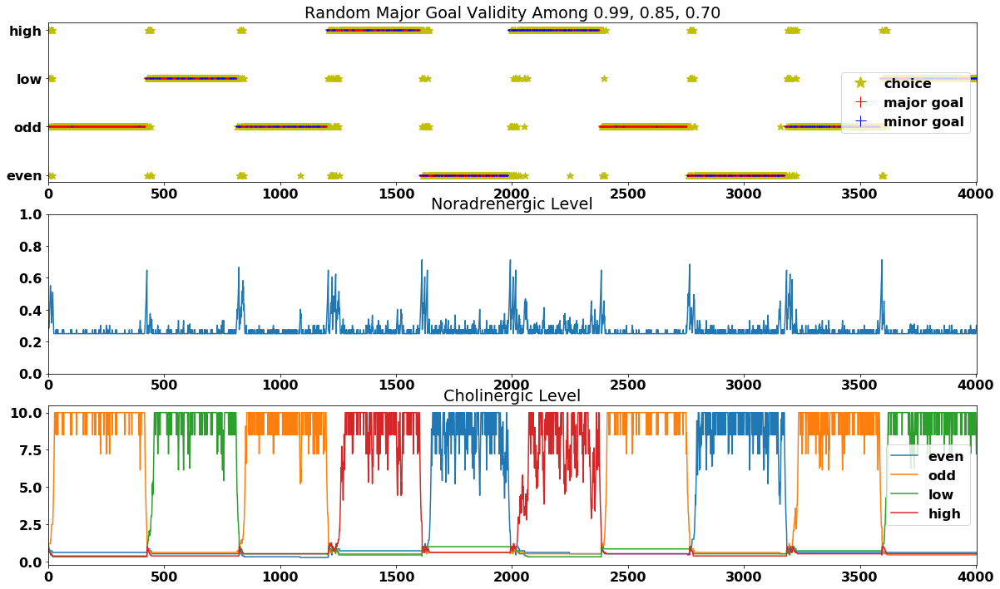

In [44]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
397/4003 = 9.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
733/4003 = 18.3% trials occurred when the predicted digit did not match the cued digit.
    347/4003 trials occurred when the predicted digit did not match the guess-target digit.
    412/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2873/4003 = 71.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [13 28 49 77 26 44 31 35 30 31], and mean of lag length (excluding consistently same cue) is 39.0


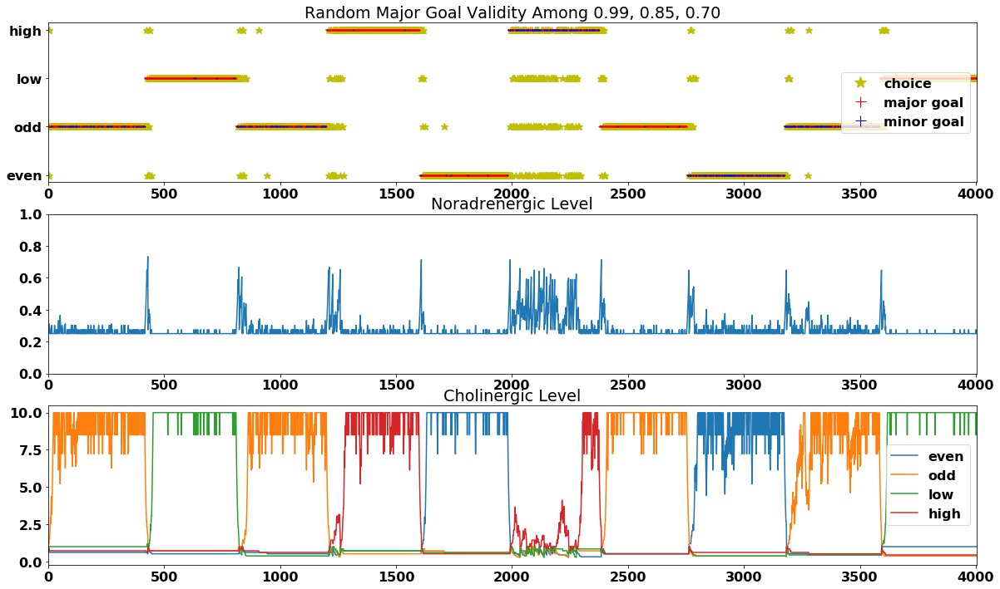

In [45]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
677/4003 = 16.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
711/4003 = 17.8% trials occurred when the predicted digit did not match the cued digit.
    335/4003 trials occurred when the predicted digit did not match the guess-target digit.
    413/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2615/4003 = 65.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 42  31  30  71 125 107  56  31  26  26], and mean of lag length (excluding consistently same cue) is 55.888888888888886


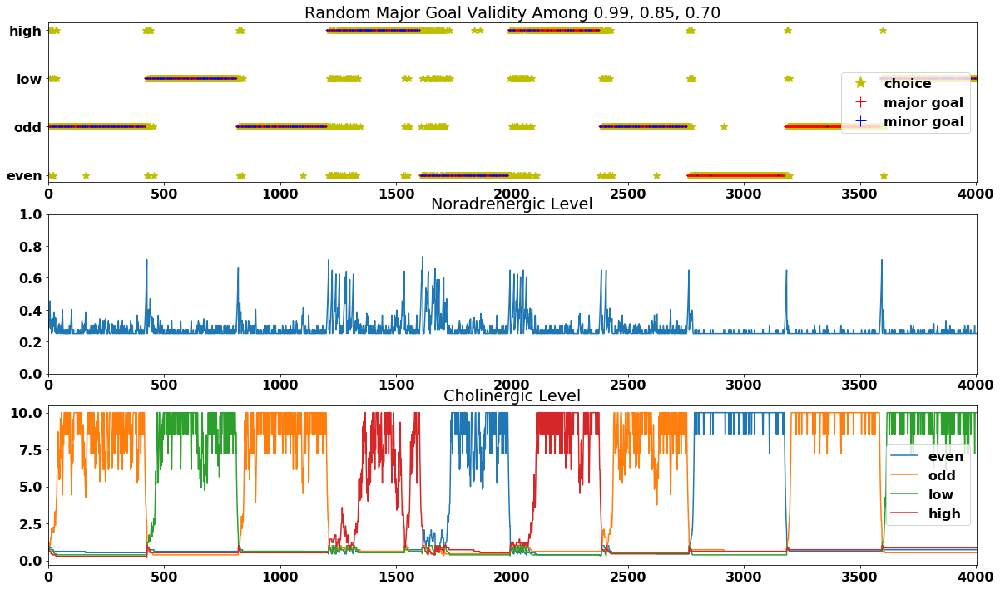

In [46]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
753/4003 = 18.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
693/4003 = 17.3% trials occurred when the predicted digit did not match the cued digit.
    342/4003 trials occurred when the predicted digit did not match the guess-target digit.
    386/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2557/4003 = 63.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 49  28  53  68  38  56  34  43  25 131], and mean of lag length (excluding consistently same cue) is 52.888888888888886


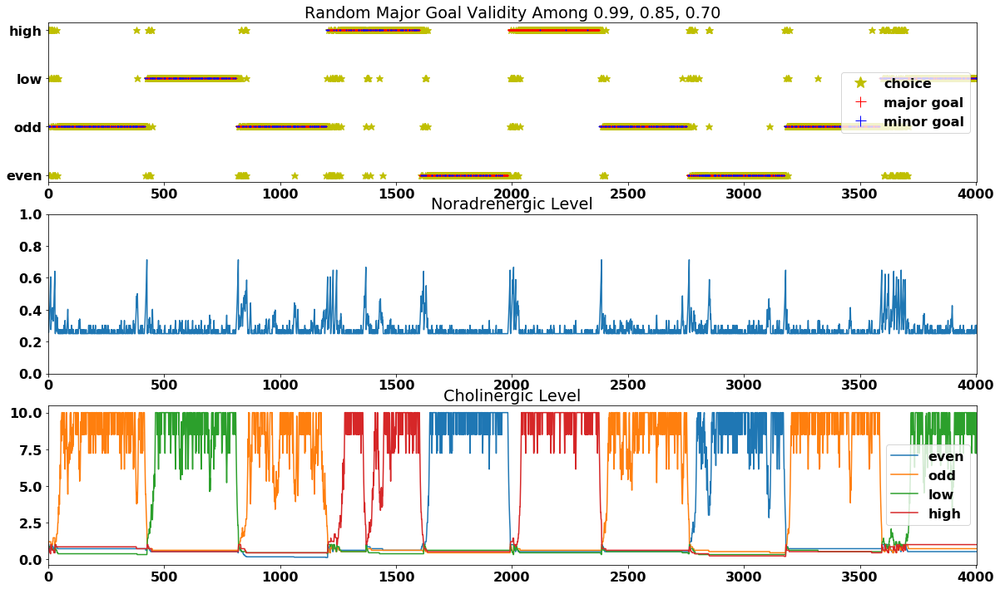

In [47]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


In [48]:
all_multi_case_probs = [all_prob_multi_1,all_prob_multi_2,all_prob_multi_3,all_prob_multi_4,all_prob_multi_5,\
                        all_prob_multi_6,all_prob_multi_7,all_prob_multi_8,all_prob_multi_9,all_prob_multi_10]
averages_multi = average_probs(all_multi_case_probs)


Average lag length is: 47
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.17012240819385463, 0.7020234823882089, 0.0, 0.12785410941793654, 0.09228078940794404, 0.08621034224331751, 0.0]


## 4.2: Two Possibly Valid Cues
Randomly change trial interval within the range (200+/-20) and have two possibly valid cues for each cue switch, and use one of the validity options: 0.99, 0.85, 0.70

In [49]:
alterValid=True

### 4.2.1: validity_choices=0.99

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
585/4003 = 14.6% trials occurred when the predicted digit did not match the cued digit.
    367/4003 trials occurred when the predicted digit did not match the guess-target digit.
    257/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3418/4003 = 85.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
35/4003 = 0.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

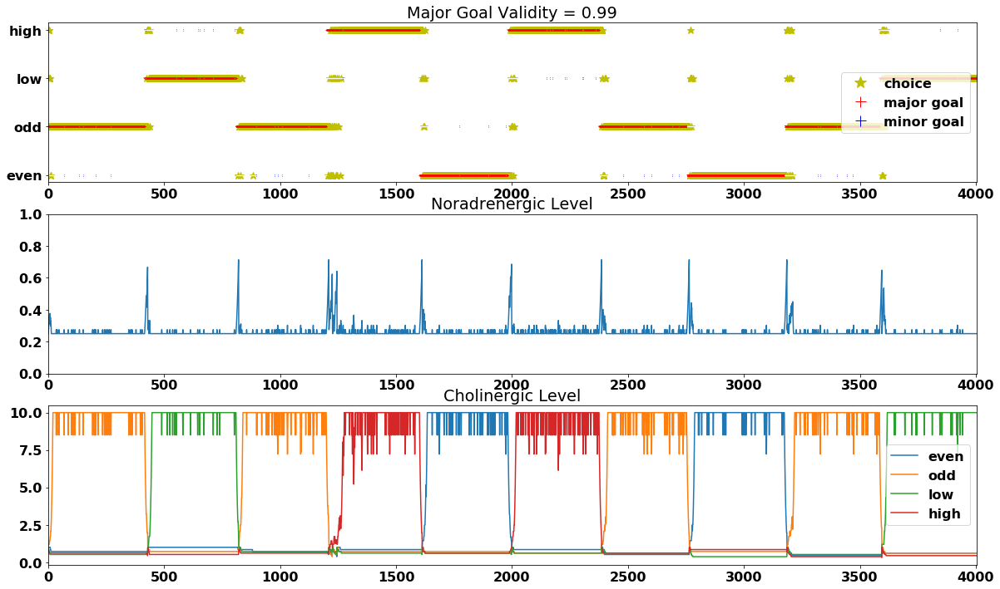

In [50]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
651/4003 = 16.3% trials occurred when the predicted digit did not match the cued digit.
    360/4003 trials occurred when the predicted digit did not match the guess-target digit.
    323/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3352/4003 = 83.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
45/4003 = 1.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

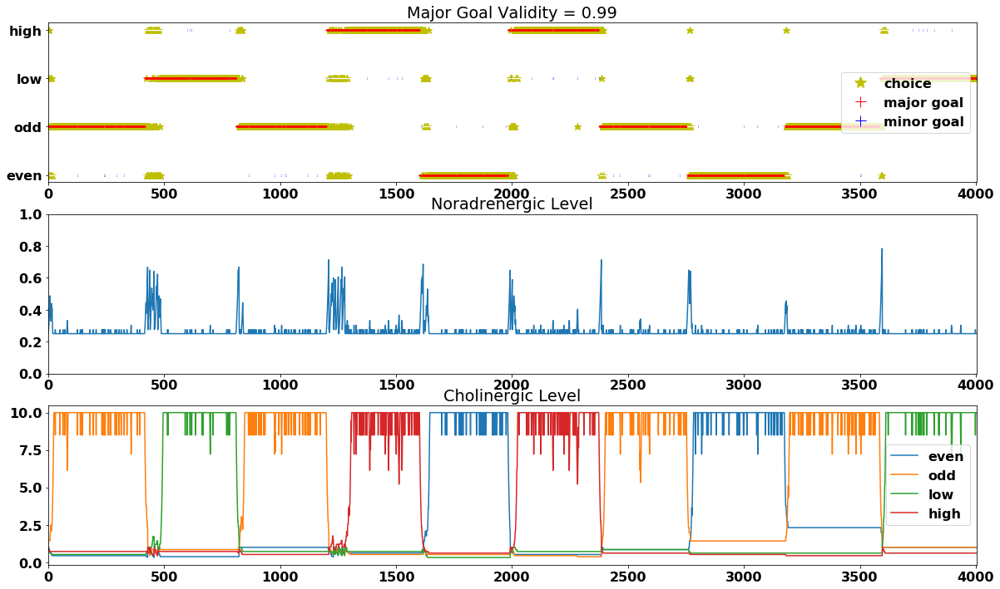

In [51]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
595/4003 = 14.9% trials occurred when the predicted digit did not match the cued digit.
    356/4003 trials occurred when the predicted digit did not match the guess-target digit.
    262/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3408/4003 = 85.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
32/4003 = 0.8% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

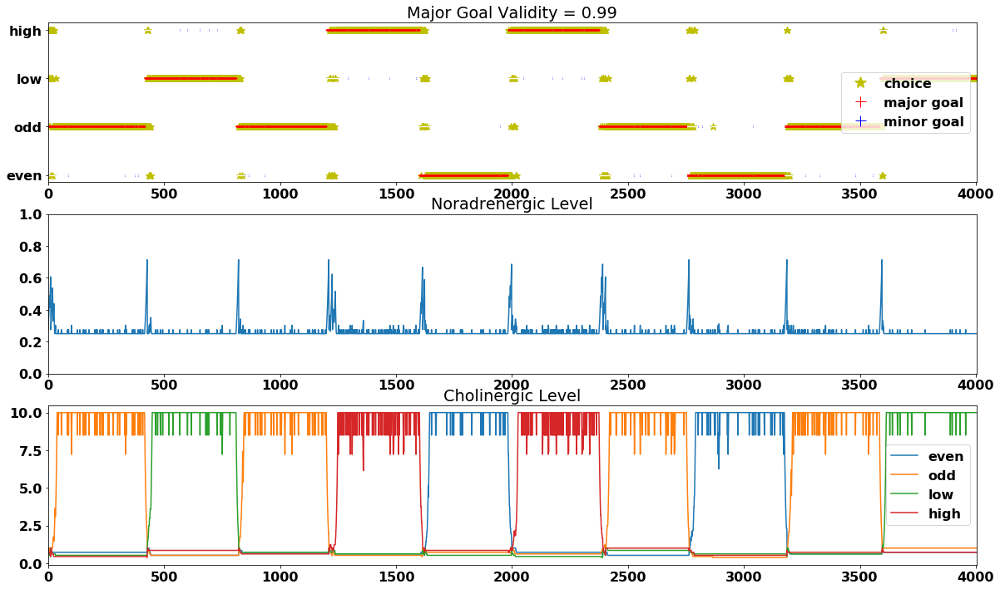

In [52]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
530/4003 = 13.2% trials occurred when the predicted digit did not match the cued digit.
    333/4003 trials occurred when the predicted digit did not match the guess-target digit.
    212/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3473/4003 = 86.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
38/4003 = 0.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

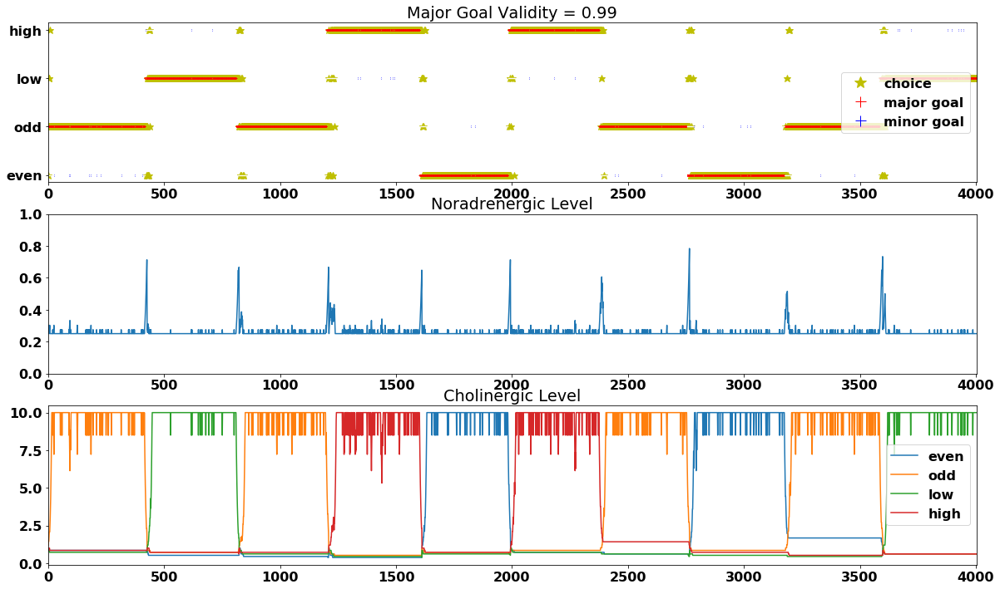

In [53]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
604/4003 = 15.1% trials occurred when the predicted digit did not match the cued digit.
    335/4003 trials occurred when the predicted digit did not match the guess-target digit.
    302/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3399/4003 = 84.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
35/4003 = 0.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

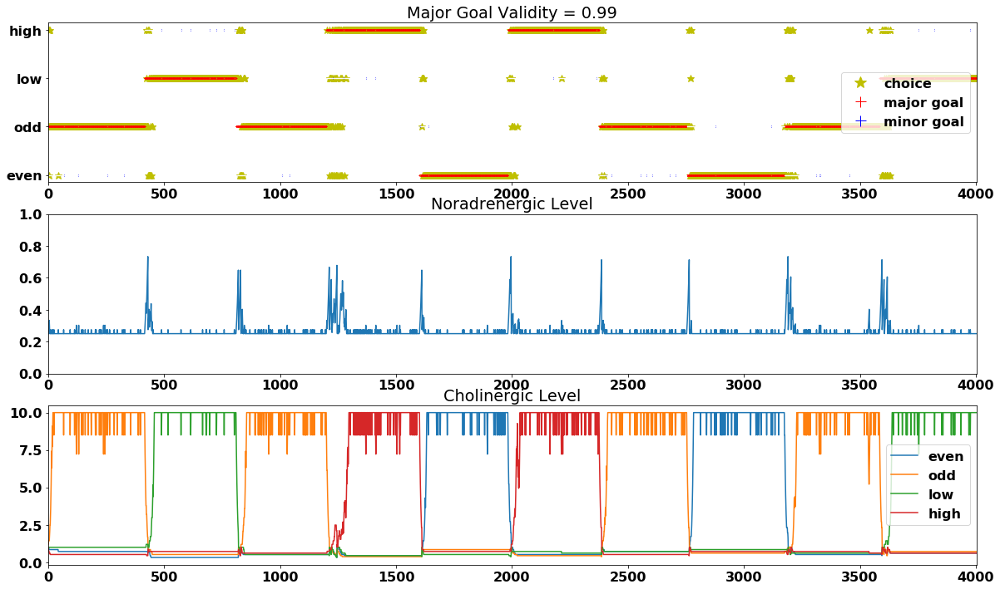

In [54]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
621/4003 = 15.5% trials occurred when the predicted digit did not match the cued digit.
    384/4003 trials occurred when the predicted digit did not match the guess-target digit.
    259/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3382/4003 = 84.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
37/4003 = 0.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

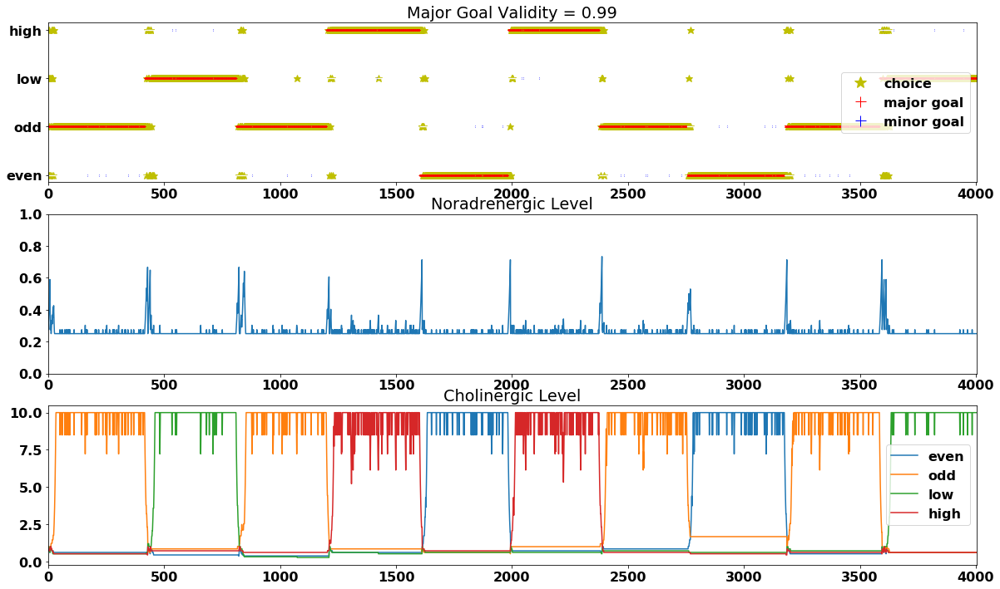

In [55]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
569/4003 = 14.2% trials occurred when the predicted digit did not match the cued digit.
    320/4003 trials occurred when the predicted digit did not match the guess-target digit.
    270/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3434/4003 = 85.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
44/4003 = 1.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

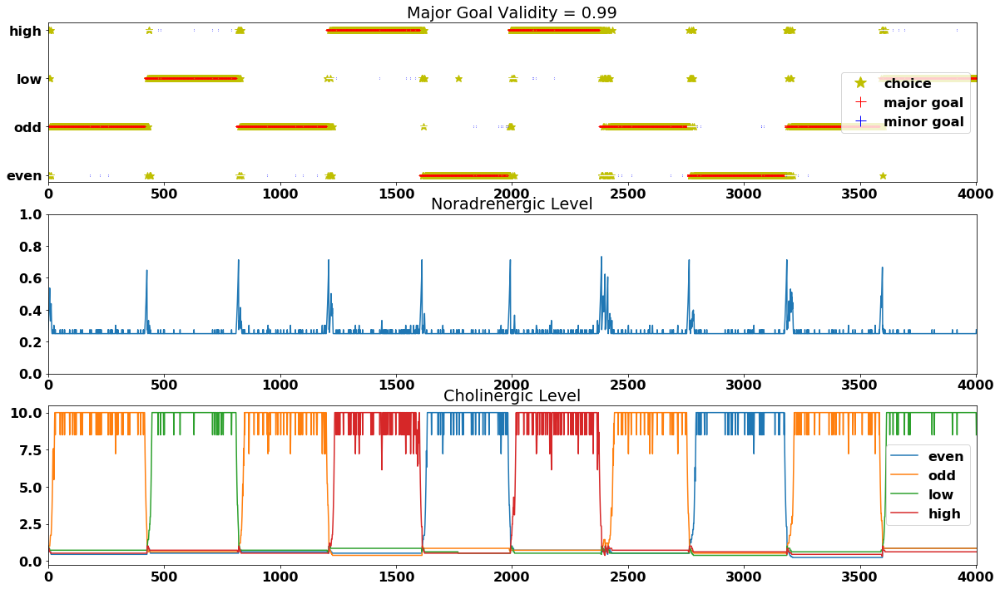

In [56]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
543/4003 = 13.6% trials occurred when the predicted digit did not match the cued digit.
    341/4003 trials occurred when the predicted digit did not match the guess-target digit.
    216/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3460/4003 = 86.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
31/4003 = 0.8% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

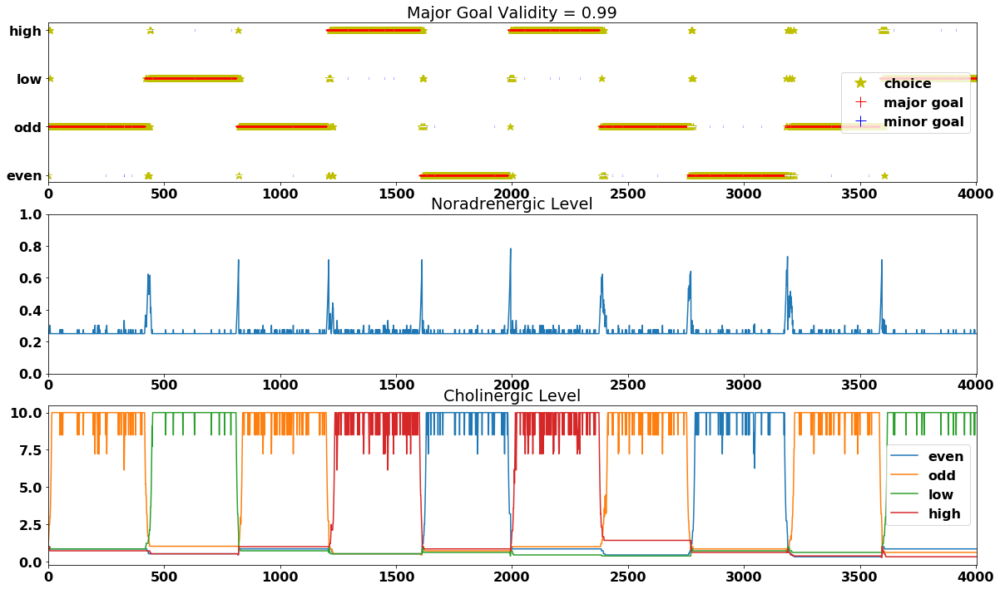

In [57]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
617/4003 = 15.4% trials occurred when the predicted digit did not match the cued digit.
    360/4003 trials occurred when the predicted digit did not match the guess-target digit.
    281/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3386/4003 = 84.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
31/4003 = 0.8% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

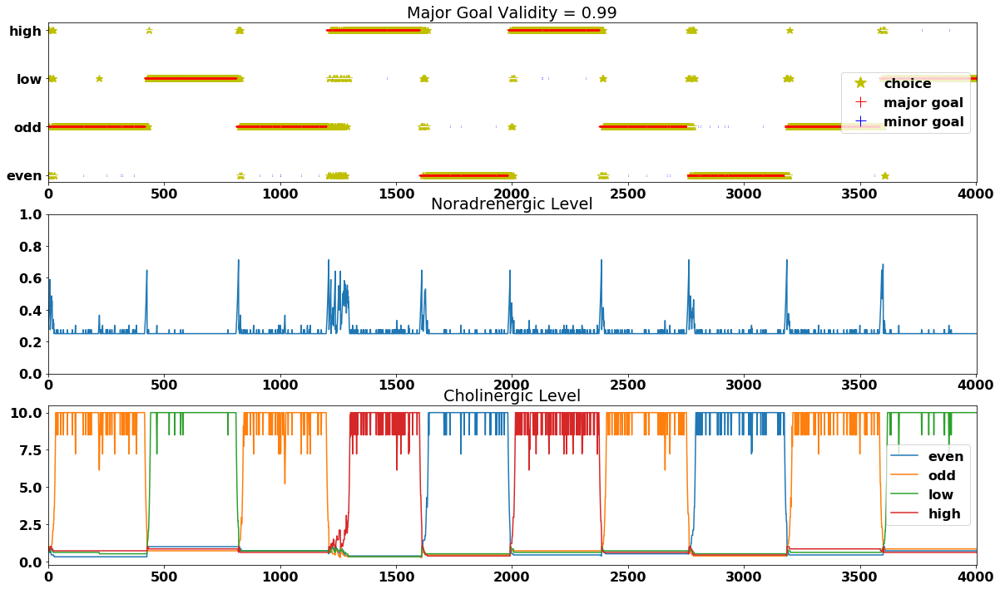

In [58]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
600/4003 = 15.0% trials occurred when the predicted digit did not match the cued digit.
    379/4003 trials occurred when the predicted digit did not match the guess-target digit.
    246/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3403/4003 = 85.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4003 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
37/4003 = 0.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

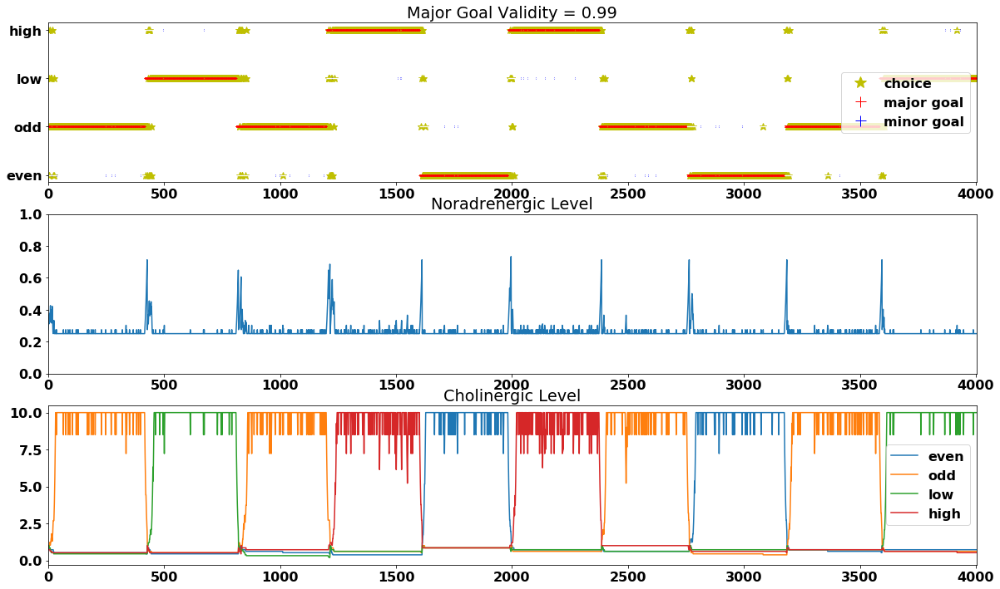

In [59]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


In [60]:
all_99a_case_probs = [all_prob_99_1a,all_prob_99_2a,all_prob_99_3a,all_prob_99_4a,all_prob_99_5a,\
                      all_prob_99_6a,all_prob_99_7a,all_prob_99_8a,all_prob_99_9a,all_prob_99_10a]
averages_99a = average_probs(all_99a_case_probs)


Average lag length is: 34
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.1477641768673495, 0.8522358231326506, 0.0, 0.0, 0.06565076192855358, 0.08830876842368224, 0.009118161378965775]


### 4.2.2: validity_choices=0.85

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1113/4003 = 27.8% trials occurred when the predicted digit did not match the cued digit.
    356/4003 trials occurred when the predicted digit did not match the guess-target digit.
    835/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2868/4003 = 71.6% trials occurred when the predicted digit matches the major cued digit and is valid
22/4003 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
483/4003 = 12.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

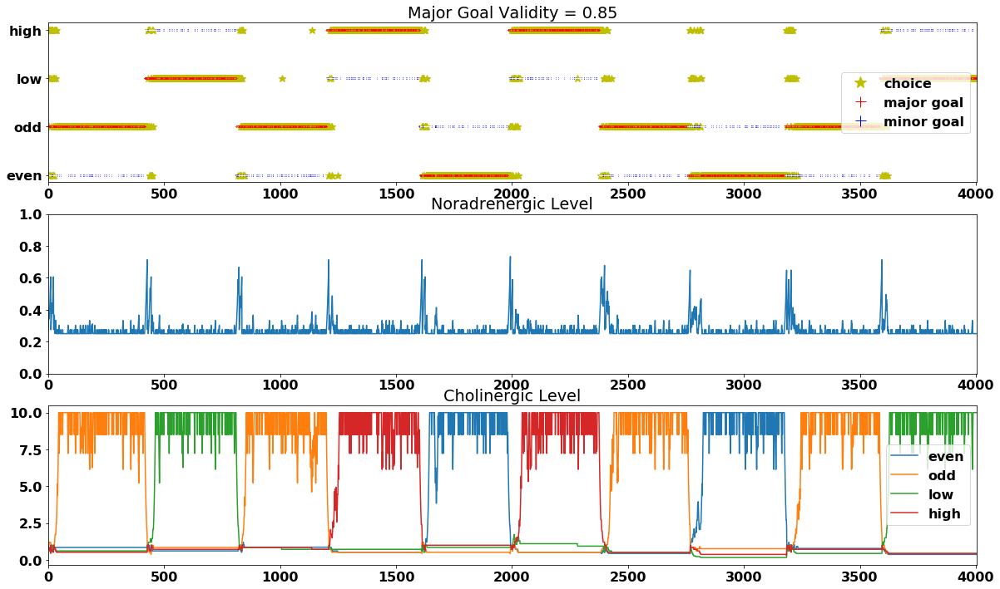

In [61]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1123/4003 = 28.1% trials occurred when the predicted digit did not match the cued digit.
    346/4003 trials occurred when the predicted digit did not match the guess-target digit.
    856/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2867/4003 = 71.6% trials occurred when the predicted digit matches the major cued digit and is valid
13/4003 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
511/4003 = 12.8% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

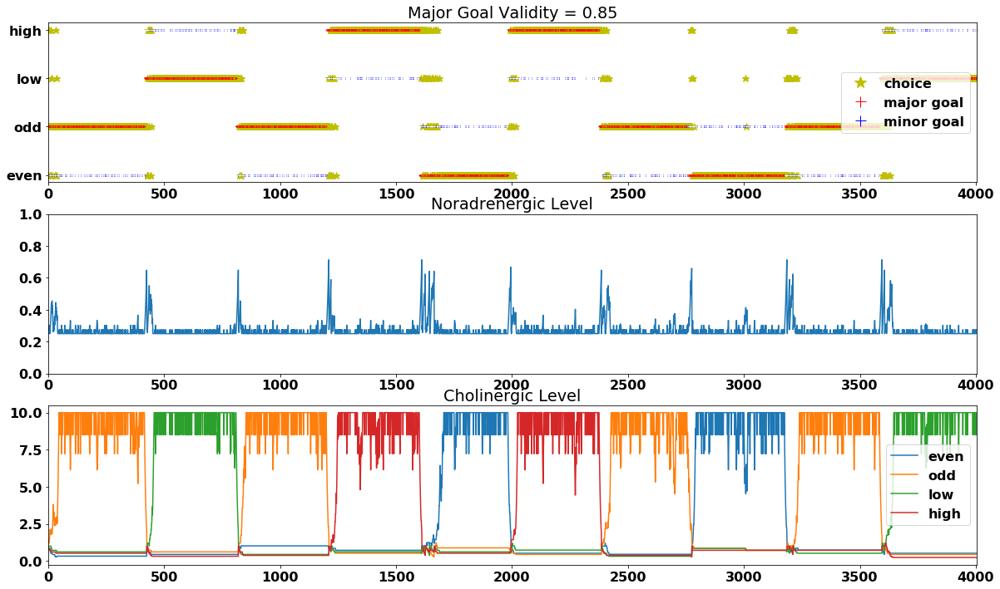

In [62]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1171/4003 = 29.3% trials occurred when the predicted digit did not match the cued digit.
    375/4003 trials occurred when the predicted digit did not match the guess-target digit.
    877/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2815/4003 = 70.3% trials occurred when the predicted digit matches the major cued digit and is valid
17/4003 = 0.4% trials occurred when the predicted digit matches the minor cued digit and is valid
469/4003 = 11.7% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

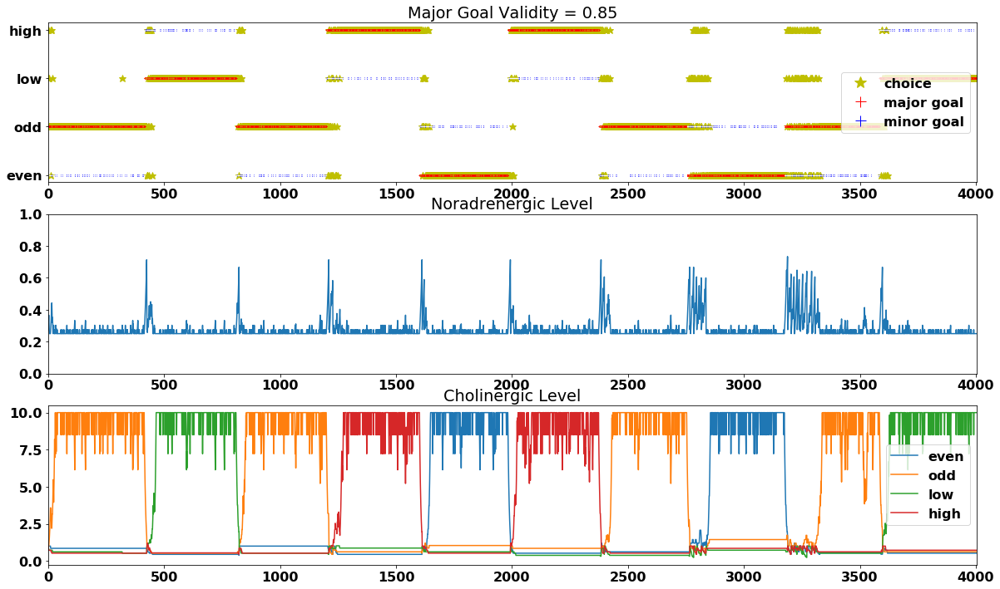

In [63]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1138/4003 = 28.4% trials occurred when the predicted digit did not match the cued digit.
    351/4003 trials occurred when the predicted digit did not match the guess-target digit.
    858/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2857/4003 = 71.4% trials occurred when the predicted digit matches the major cued digit and is valid
8/4003 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
532/4003 = 13.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

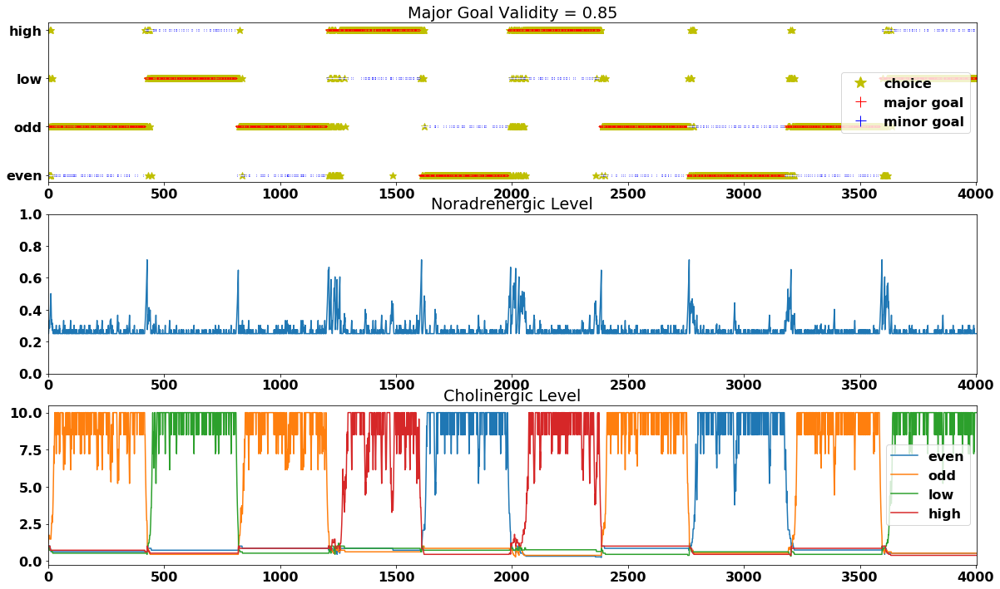

In [64]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1148/4003 = 28.7% trials occurred when the predicted digit did not match the cued digit.
    371/4003 trials occurred when the predicted digit did not match the guess-target digit.
    855/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2834/4003 = 70.8% trials occurred when the predicted digit matches the major cued digit and is valid
21/4003 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
495/4003 = 12.4% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

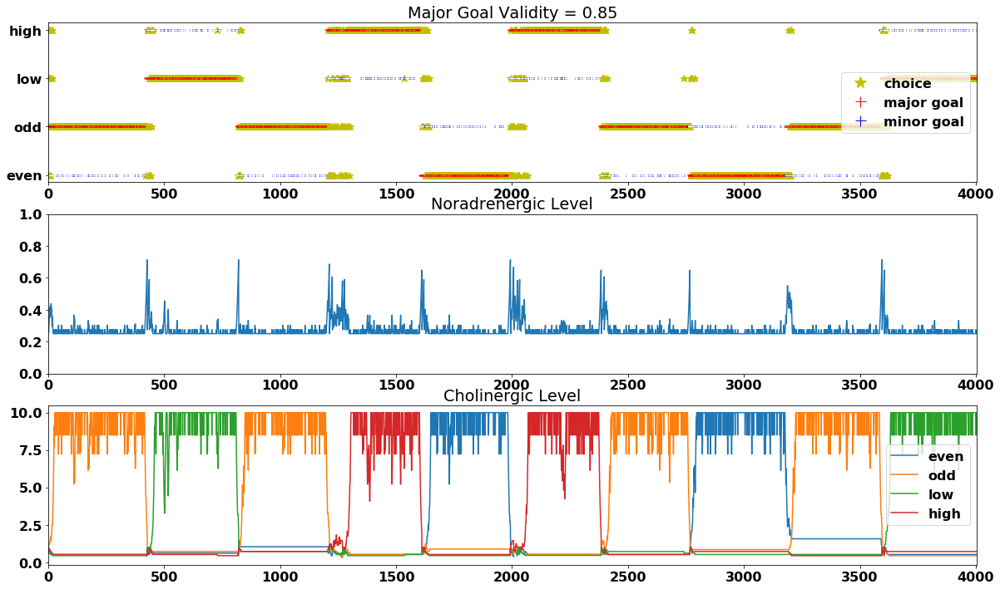

In [65]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1093/4003 = 27.3% trials occurred when the predicted digit did not match the cued digit.
    327/4003 trials occurred when the predicted digit did not match the guess-target digit.
    826/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2894/4003 = 72.3% trials occurred when the predicted digit matches the major cued digit and is valid
16/4003 = 0.4% trials occurred when the predicted digit matches the minor cued digit and is valid
510/4003 = 12.7% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

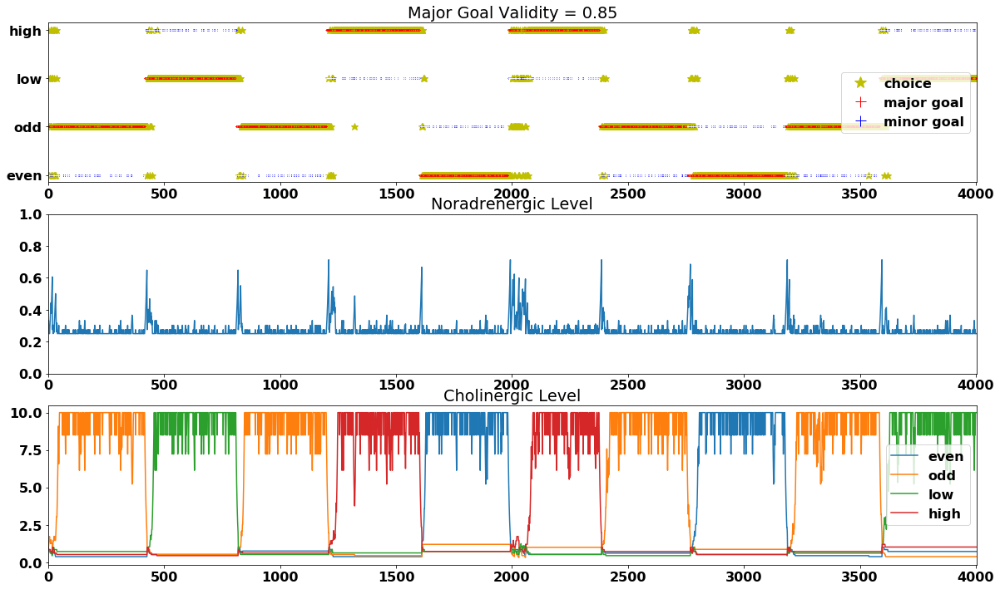

In [66]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1088/4003 = 27.2% trials occurred when the predicted digit did not match the cued digit.
    353/4003 trials occurred when the predicted digit did not match the guess-target digit.
    805/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2903/4003 = 72.5% trials occurred when the predicted digit matches the major cued digit and is valid
12/4003 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
497/4003 = 12.4% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

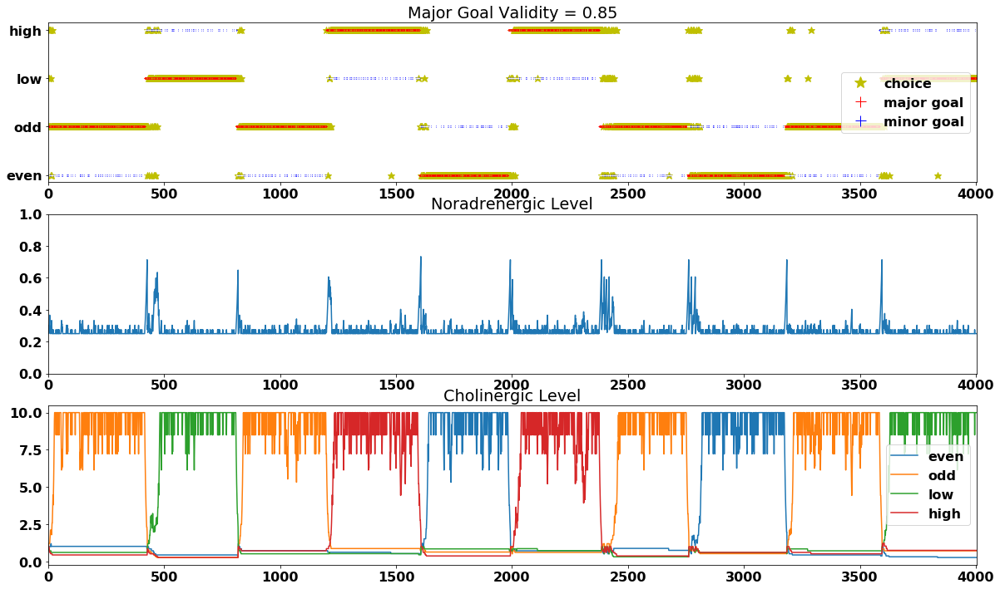

In [67]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1107/4003 = 27.7% trials occurred when the predicted digit did not match the cued digit.
    359/4003 trials occurred when the predicted digit did not match the guess-target digit.
    835/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2887/4003 = 72.1% trials occurred when the predicted digit matches the major cued digit and is valid
9/4003 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
511/4003 = 12.8% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

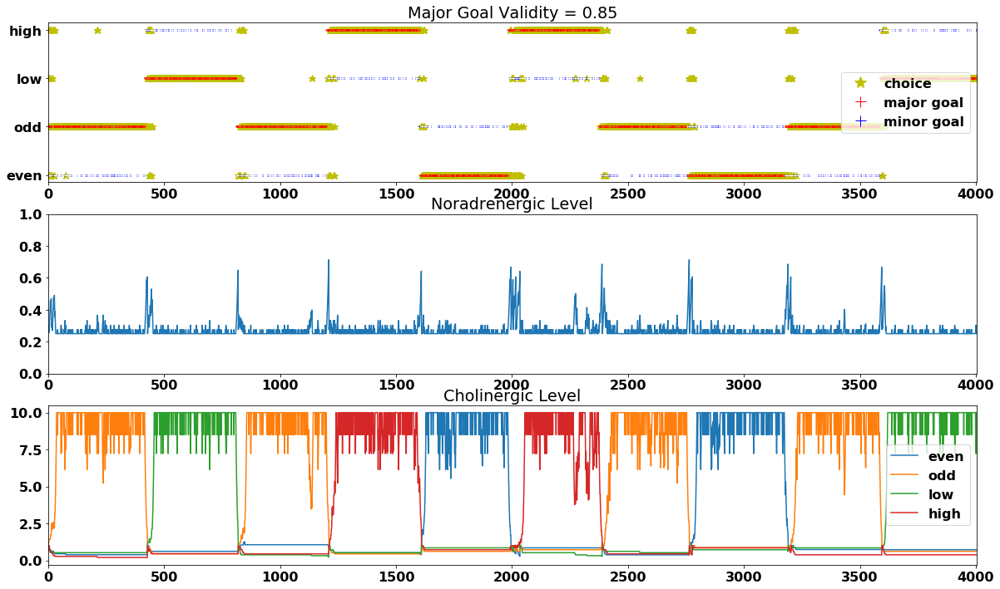

In [68]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1125/4003 = 28.1% trials occurred when the predicted digit did not match the cued digit.
    352/4003 trials occurred when the predicted digit did not match the guess-target digit.
    836/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2867/4003 = 71.6% trials occurred when the predicted digit matches the major cued digit and is valid
11/4003 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
528/4003 = 13.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

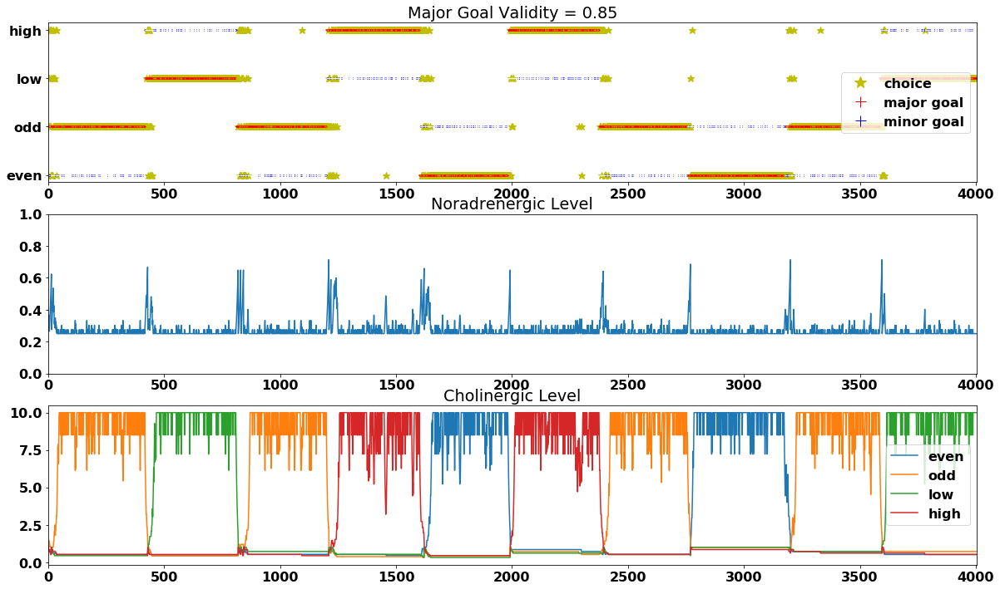

In [69]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1110/4003 = 27.7% trials occurred when the predicted digit did not match the cued digit.
    374/4003 trials occurred when the predicted digit did not match the guess-target digit.
    809/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2881/4003 = 72.0% trials occurred when the predicted digit matches the major cued digit and is valid
12/4003 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
503/4003 = 12.6% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

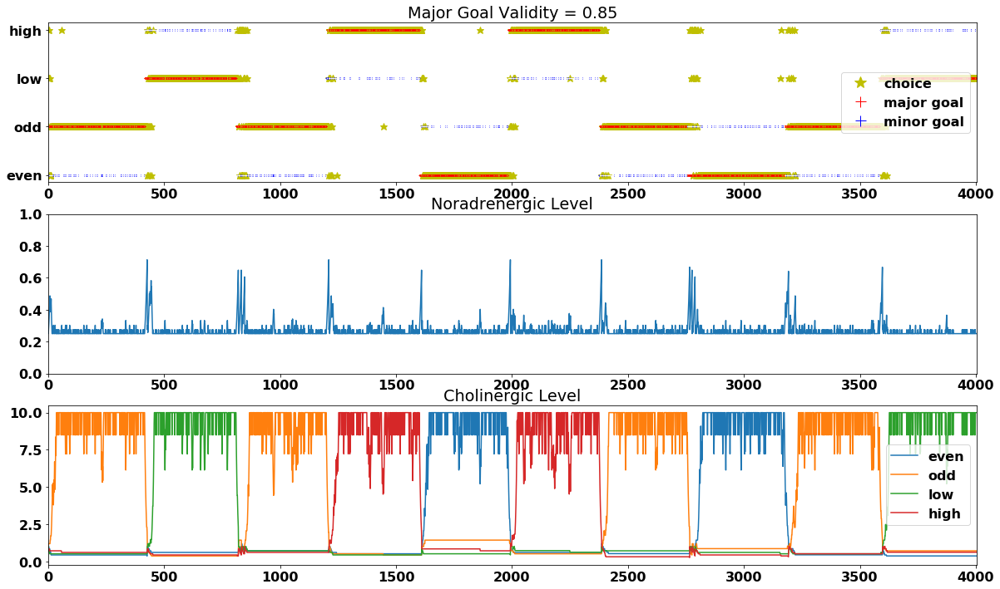

In [70]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


In [71]:
all_85a_case_probs = [all_prob_85_1a,all_prob_85_2a,all_prob_85_3a,all_prob_85_4a,all_prob_85_5a,\
                      all_prob_85_6a,all_prob_85_7a,all_prob_85_8a,all_prob_85_9a,all_prob_85_10a]
averages_85a = average_probs(all_85a_case_probs)


Average lag length is: 44
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.28018985760679493, 0.7162877841618787, 0.0035223582313265054, 0.0, 0.20964276792405695, 0.0890332250811891, 0.12588058955783163]


### 4.2.3: validity_choices=0.7

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1752/4003 = 43.8% trials occurred when the predicted digit did not match the cued digit.
    381/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1515/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2193/4003 = 54.8% trials occurred when the predicted digit matches the major cued digit and is valid
58/4003 = 1.4% trials occurred when the predicted digit matches the minor cued digit and is valid
936/4003 = 23.4% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

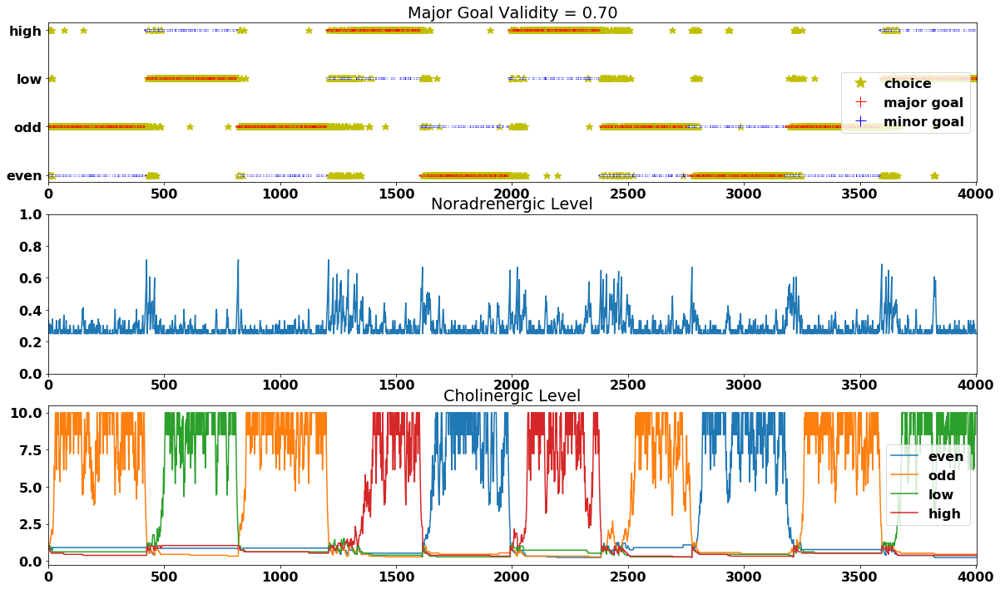

In [72]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1714/4003 = 42.8% trials occurred when the predicted digit did not match the cued digit.
    347/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1521/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2229/4003 = 55.7% trials occurred when the predicted digit matches the major cued digit and is valid
60/4003 = 1.5% trials occurred when the predicted digit matches the minor cued digit and is valid
950/4003 = 23.7% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

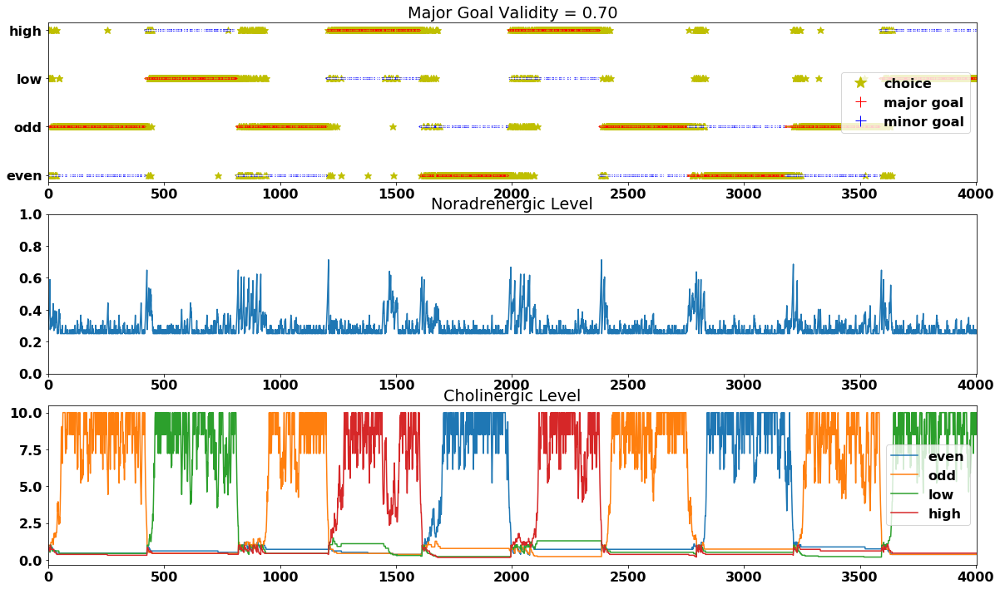

In [73]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1739/4003 = 43.4% trials occurred when the predicted digit did not match the cued digit.
    334/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1533/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2206/4003 = 55.1% trials occurred when the predicted digit matches the major cued digit and is valid
58/4003 = 1.4% trials occurred when the predicted digit matches the minor cued digit and is valid
913/4003 = 22.8% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

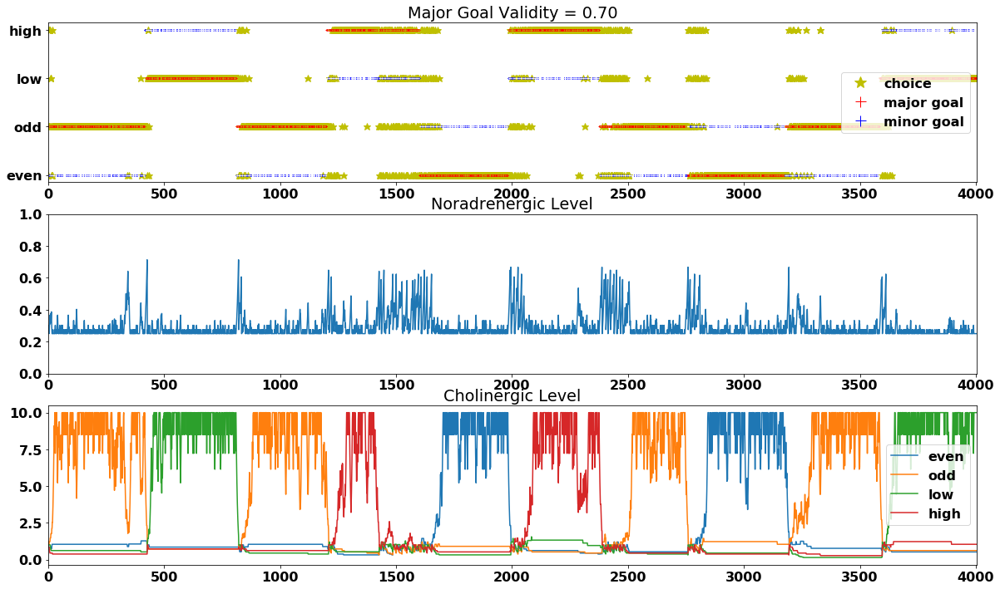

In [74]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1663/4003 = 41.5% trials occurred when the predicted digit did not match the cued digit.
    345/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1444/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2288/4003 = 57.2% trials occurred when the predicted digit matches the major cued digit and is valid
52/4003 = 1.3% trials occurred when the predicted digit matches the minor cued digit and is valid
900/4003 = 22.5% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

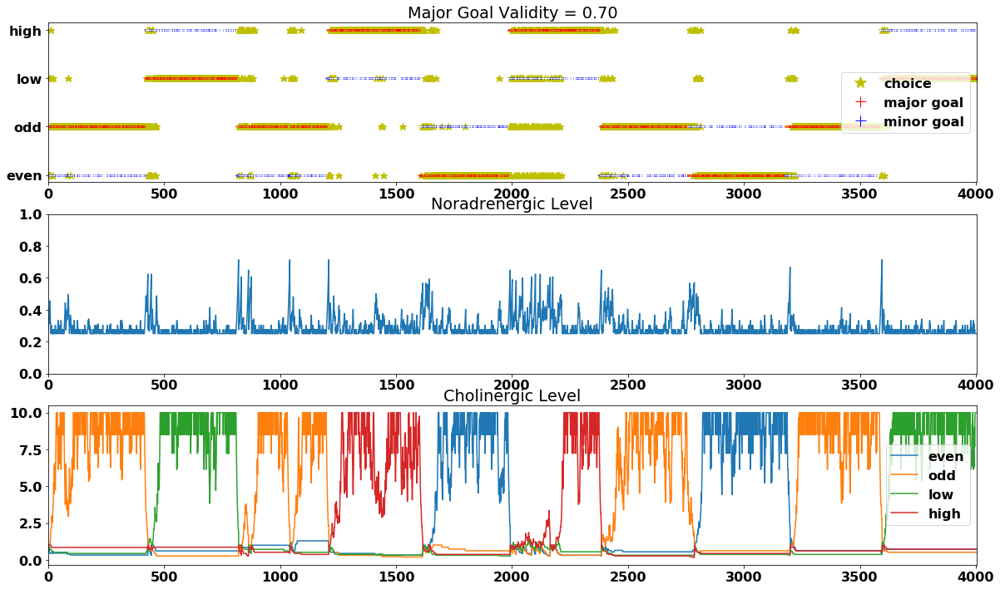

In [75]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1747/4003 = 43.6% trials occurred when the predicted digit did not match the cued digit.
    324/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1552/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2185/4003 = 54.6% trials occurred when the predicted digit matches the major cued digit and is valid
71/4003 = 1.8% trials occurred when the predicted digit matches the minor cued digit and is valid
925/4003 = 23.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

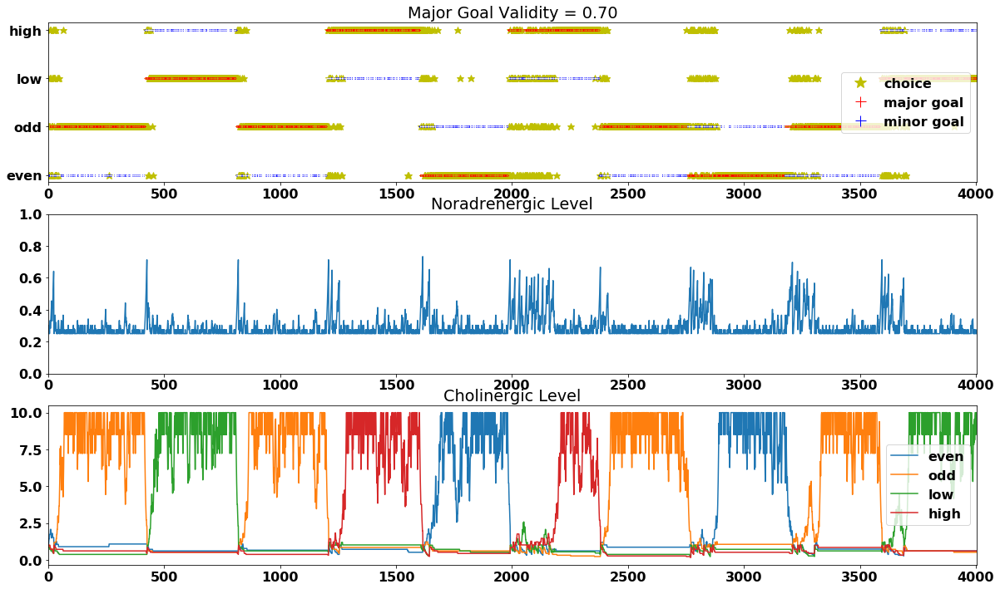

In [76]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1710/4003 = 42.7% trials occurred when the predicted digit did not match the cued digit.
    353/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1500/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2258/4003 = 56.4% trials occurred when the predicted digit matches the major cued digit and is valid
35/4003 = 0.9% trials occurred when the predicted digit matches the minor cued digit and is valid
998/4003 = 24.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

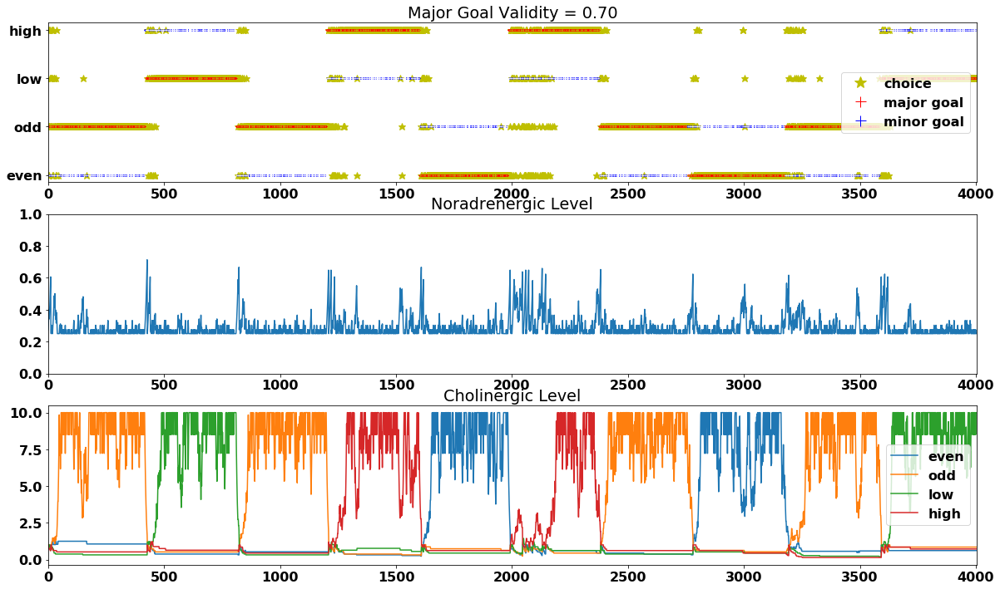

In [77]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1717/4003 = 42.9% trials occurred when the predicted digit did not match the cued digit.
    333/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1503/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2220/4003 = 55.5% trials occurred when the predicted digit matches the major cued digit and is valid
66/4003 = 1.6% trials occurred when the predicted digit matches the minor cued digit and is valid
932/4003 = 23.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

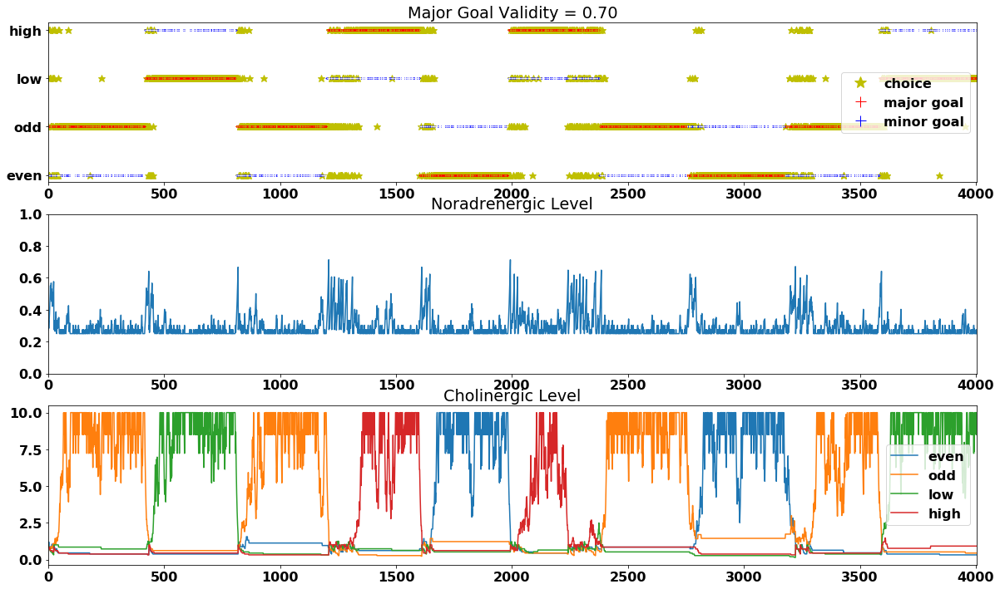

In [78]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1745/4003 = 43.6% trials occurred when the predicted digit did not match the cued digit.
    373/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1504/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2212/4003 = 55.3% trials occurred when the predicted digit matches the major cued digit and is valid
46/4003 = 1.1% trials occurred when the predicted digit matches the minor cued digit and is valid
965/4003 = 24.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

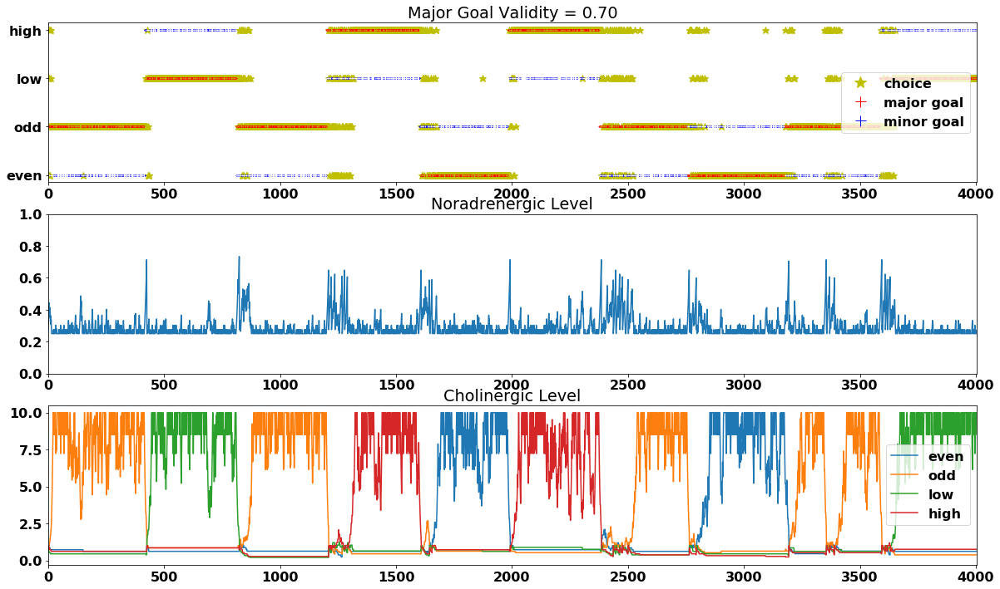

In [79]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1745/4003 = 43.6% trials occurred when the predicted digit did not match the cued digit.
    351/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1531/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2210/4003 = 55.2% trials occurred when the predicted digit matches the major cued digit and is valid
48/4003 = 1.2% trials occurred when the predicted digit matches the minor cued digit and is valid
950/4003 = 23.7% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

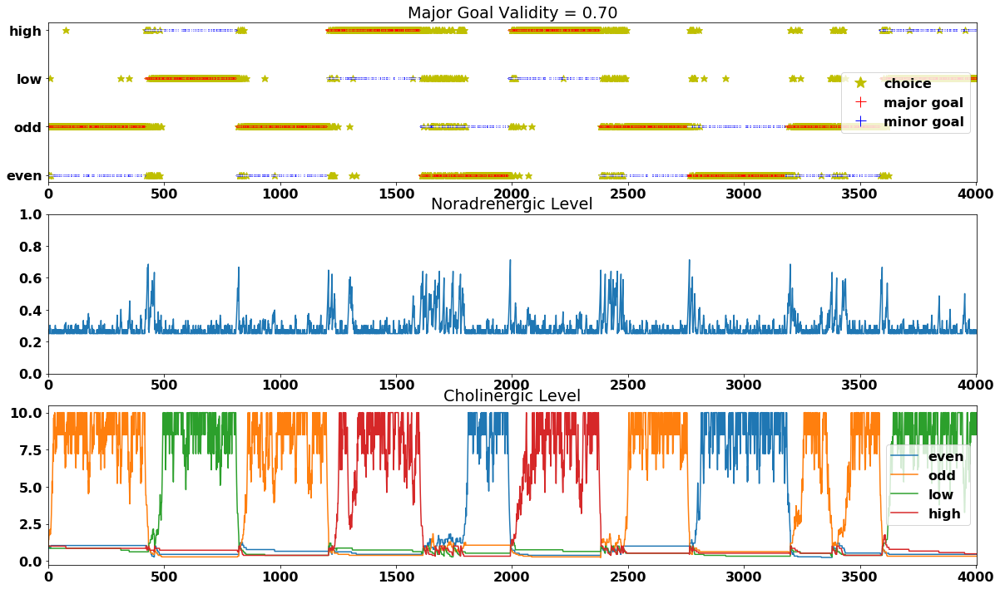

In [80]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1786/4003 = 44.6% trials occurred when the predicted digit did not match the cued digit.
    346/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1572/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2141/4003 = 53.5% trials occurred when the predicted digit matches the major cued digit and is valid
76/4003 = 1.9% trials occurred when the predicted digit matches the minor cued digit and is valid
972/4003 = 24.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

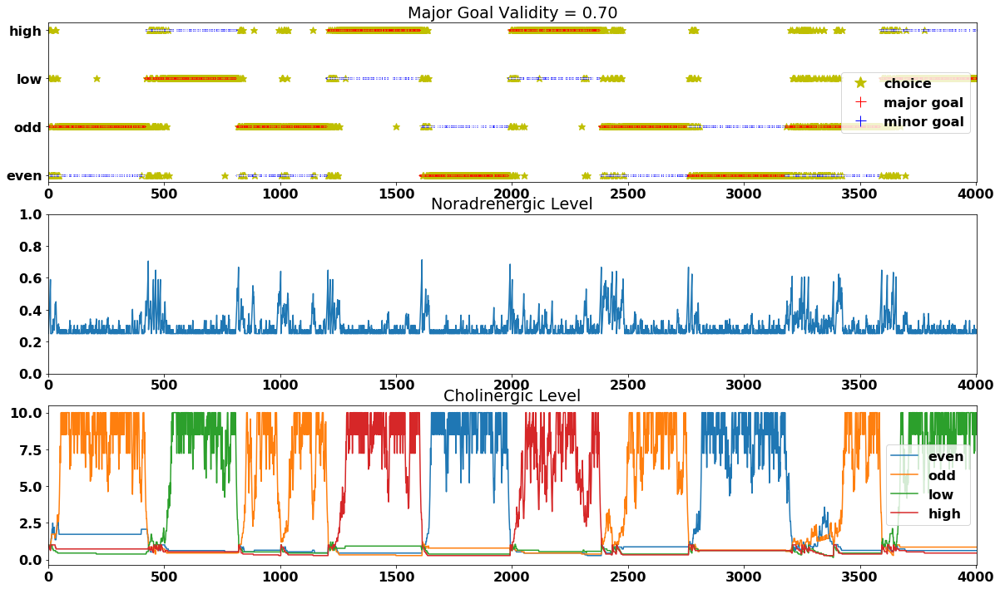

In [81]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


In [82]:
all_70a_case_probs = [all_prob_70_1a,all_prob_70_2a,all_prob_70_3a,all_prob_70_4a,all_prob_70_5a,\
                      all_prob_70_6a,all_prob_70_7a,all_prob_70_8a,all_prob_70_9a,all_prob_70_10a]
averages_70a = average_probs(all_70a_case_probs)


Average lag length is: 68
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.4326255308518611, 0.5531351486385211, 0.014239320509617787, 0.0, 0.37909068198850865, 0.08710966774918812, 0.23584811391456412]


### 4.2.4: validity_choices=[0.99, 0.85, 0.70]

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
994/4003 = 24.8% trials occurred when the predicted digit did not match the cued digit.
    382/4003 trials occurred when the predicted digit did not match the guess-target digit.
    667/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2990/4003 = 74.7% trials occurred when the predicted digit matches the major cued digit and is valid
19/4003 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
344/4003 = 8.6% trials occurred when the predicted digit matches the major cued digit but is invalidly al

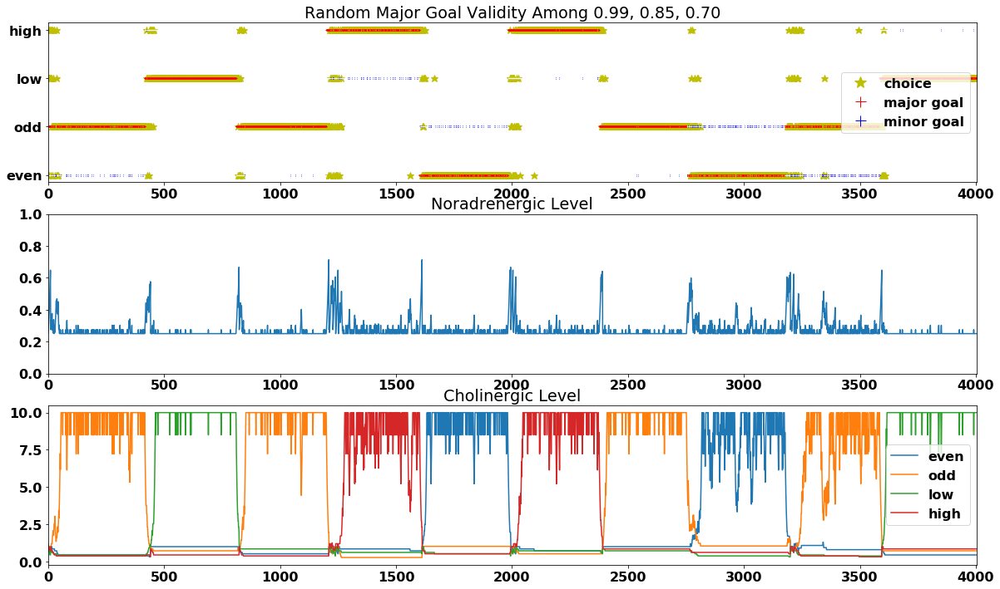

In [83]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1292/4003 = 32.3% trials occurred when the predicted digit did not match the cued digit.
    373/4003 trials occurred when the predicted digit did not match the guess-target digit.
    999/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2691/4003 = 67.2% trials occurred when the predicted digit matches the major cued digit and is valid
20/4003 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
595/4003 = 14.9% trials occurred when the predicted digit matches the major cued digit but is invalidly 

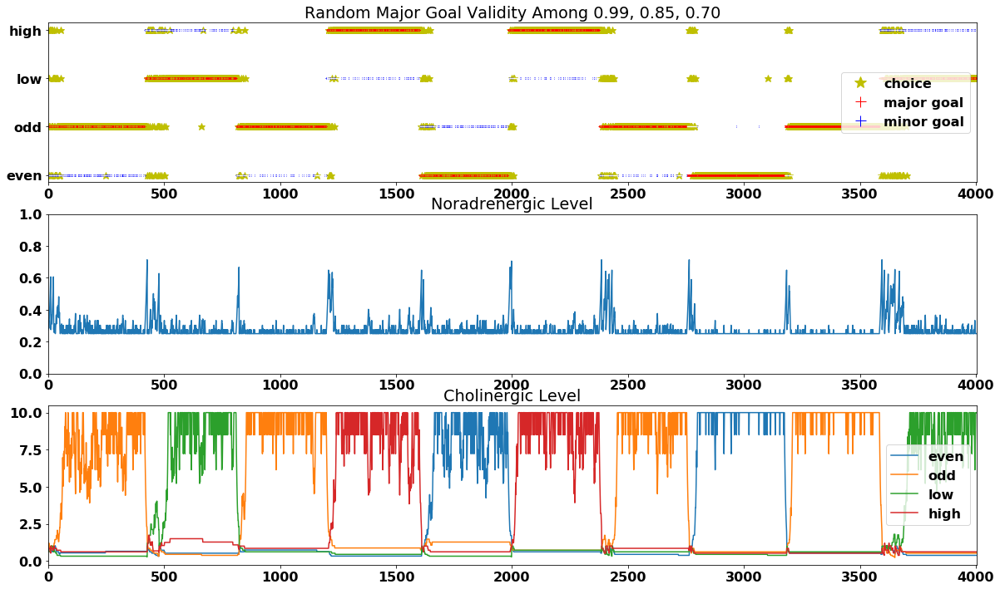

In [84]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1071/4003 = 26.8% trials occurred when the predicted digit did not match the cued digit.
    344/4003 trials occurred when the predicted digit did not match the guess-target digit.
    783/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2911/4003 = 72.7% trials occurred when the predicted digit matches the major cued digit and is valid
21/4003 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
486/4003 = 12.1% trials occurred when the predicted digit matches the major cued digit but is invalidly 

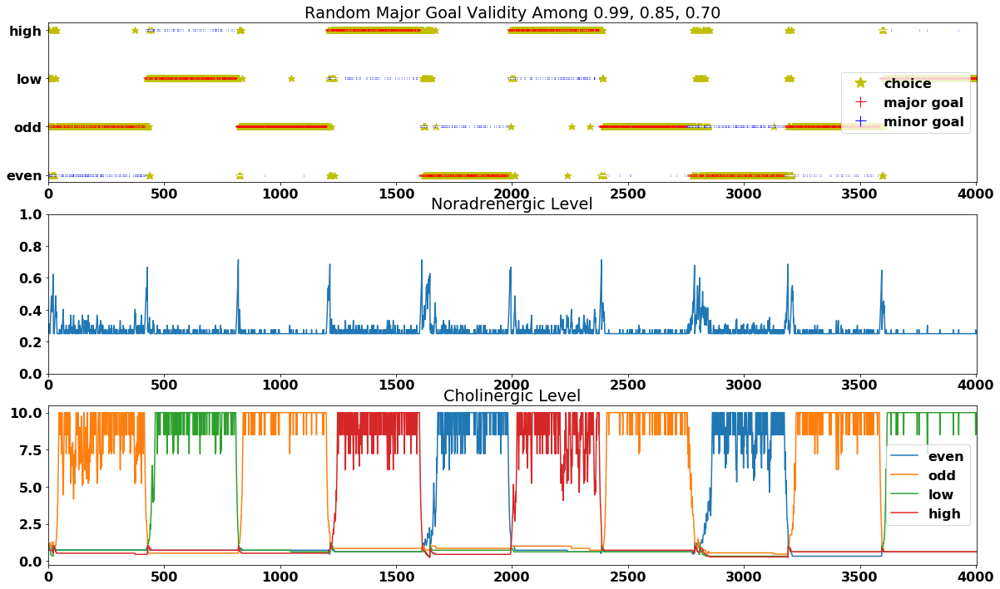

In [85]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1284/4003 = 32.1% trials occurred when the predicted digit did not match the cued digit.
    337/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1036/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2681/4003 = 67.0% trials occurred when the predicted digit matches the major cued digit and is valid
38/4003 = 0.9% trials occurred when the predicted digit matches the minor cued digit and is valid
596/4003 = 14.9% trials occurred when the predicted digit matches the major cued digit but is invalidly

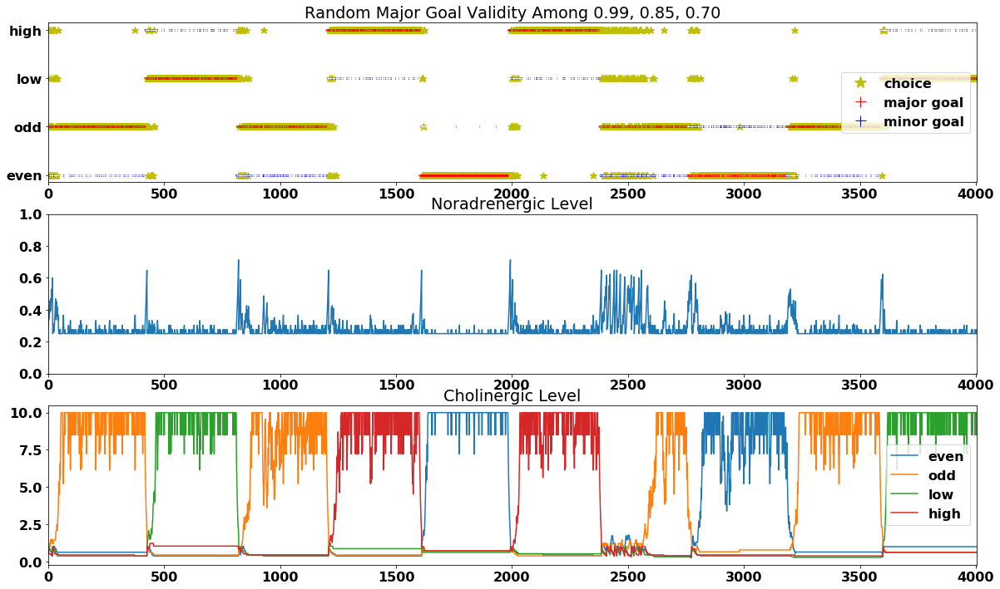

In [86]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1094/4003 = 27.3% trials occurred when the predicted digit did not match the cued digit.
    383/4003 trials occurred when the predicted digit did not match the guess-target digit.
    773/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2896/4003 = 72.3% trials occurred when the predicted digit matches the major cued digit and is valid
13/4003 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
455/4003 = 11.4% trials occurred when the predicted digit matches the major cued digit but is invalidly 

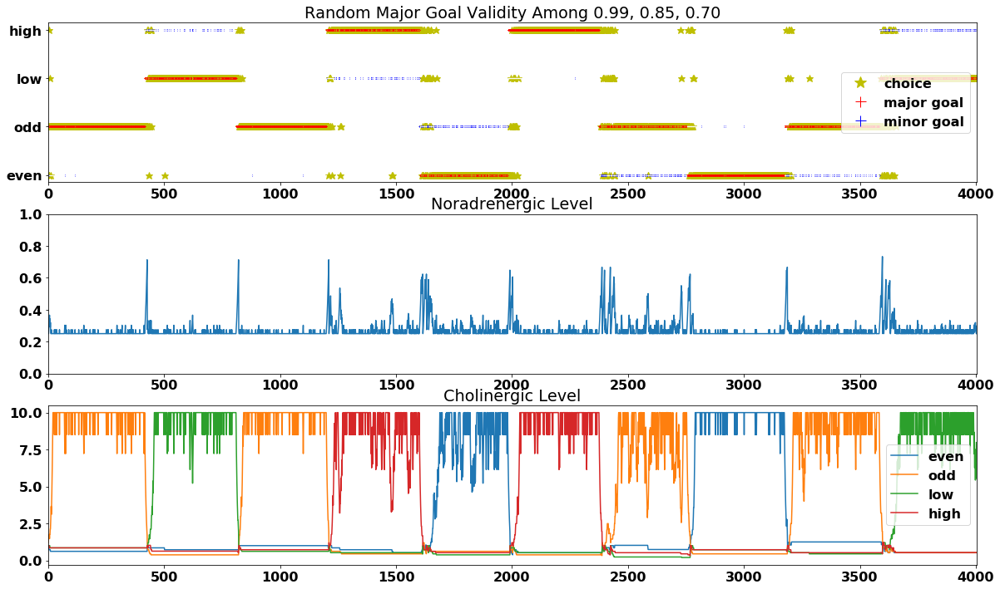

In [87]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1211/4003 = 30.3% trials occurred when the predicted digit did not match the cued digit.
    391/4003 trials occurred when the predicted digit did not match the guess-target digit.
    916/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2774/4003 = 69.3% trials occurred when the predicted digit matches the major cued digit and is valid
18/4003 = 0.4% trials occurred when the predicted digit matches the minor cued digit and is valid
524/4003 = 13.1% trials occurred when the predicted digit matches the major cued digit but is invalidly 

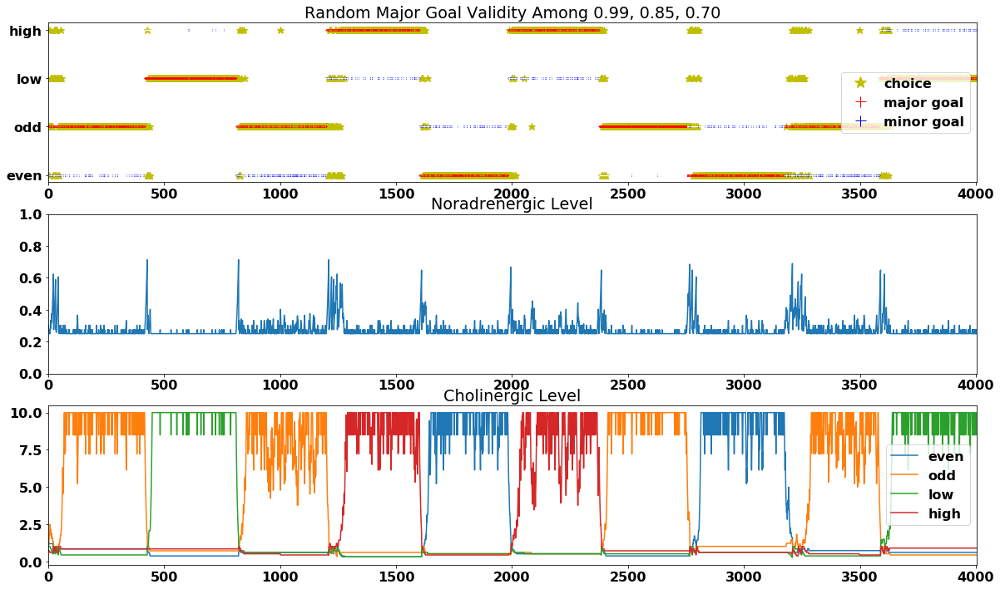

In [88]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1072/4003 = 26.8% trials occurred when the predicted digit did not match the cued digit.
    332/4003 trials occurred when the predicted digit did not match the guess-target digit.
    809/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2907/4003 = 72.6% trials occurred when the predicted digit matches the major cued digit and is valid
24/4003 = 0.6% trials occurred when the predicted digit matches the minor cued digit and is valid
469/4003 = 11.7% trials occurred when the predicted digit matches the major cued digit but is invalidly 

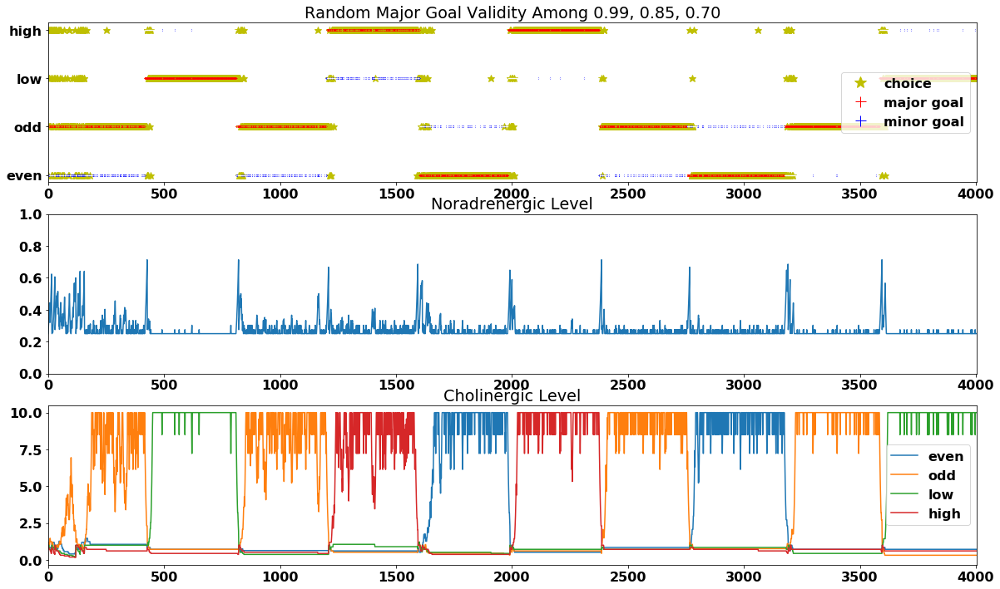

In [89]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1106/4003 = 27.6% trials occurred when the predicted digit did not match the cued digit.
    339/4003 trials occurred when the predicted digit did not match the guess-target digit.
    845/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2874/4003 = 71.8% trials occurred when the predicted digit matches the major cued digit and is valid
23/4003 = 0.6% trials occurred when the predicted digit matches the minor cued digit and is valid
508/4003 = 12.7% trials occurred when the predicted digit matches the major cued digit but is invalidly 

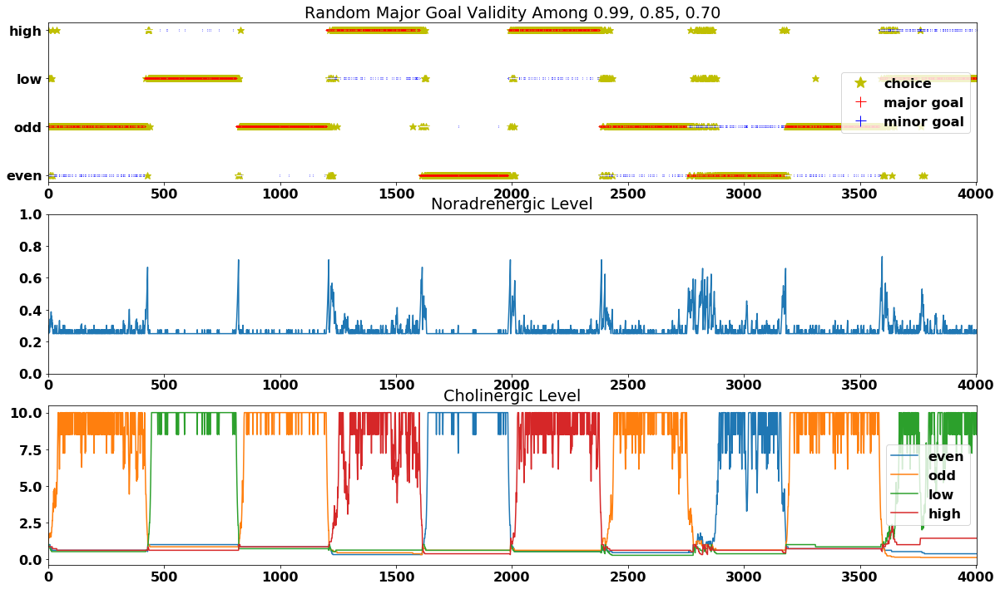

In [90]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1036/4003 = 25.9% trials occurred when the predicted digit did not match the cued digit.
    362/4003 trials occurred when the predicted digit did not match the guess-target digit.
    741/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2935/4003 = 73.3% trials occurred when the predicted digit matches the major cued digit and is valid
32/4003 = 0.8% trials occurred when the predicted digit matches the minor cued digit and is valid
351/4003 = 8.8% trials occurred when the predicted digit matches the major cued digit but is invalidly a

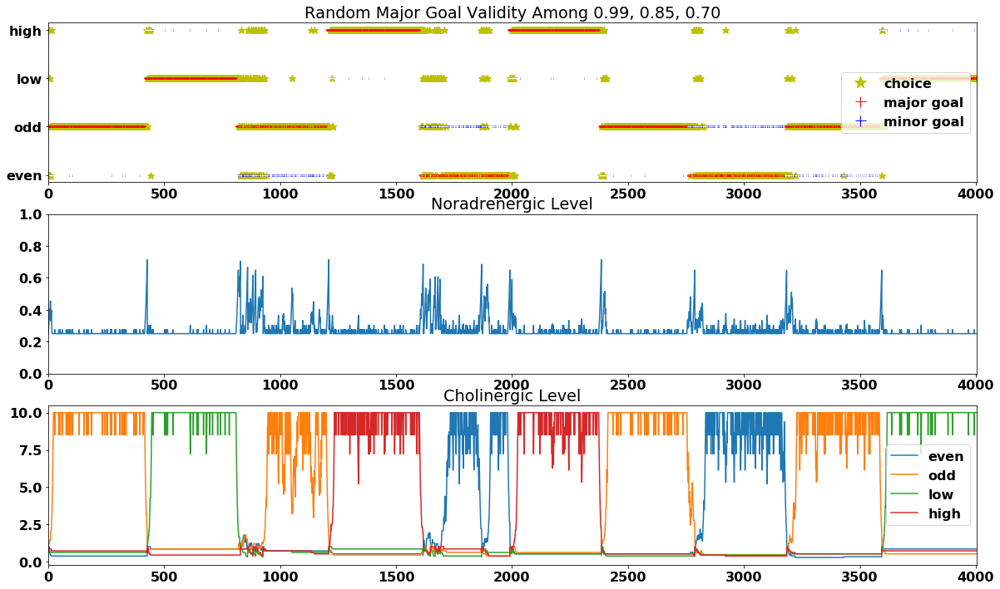

In [91]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4003 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1463/4003 = 36.5% trials occurred when the predicted digit did not match the cued digit.
    353/4003 trials occurred when the predicted digit did not match the guess-target digit.
    1224/4003 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2500/4003 = 62.5% trials occurred when the predicted digit matches the major cued digit and is valid
40/4003 = 1.0% trials occurred when the predicted digit matches the minor cued digit and is valid
730/4003 = 18.2% trials occurred when the predicted digit matches the major cued digit but is invalidly

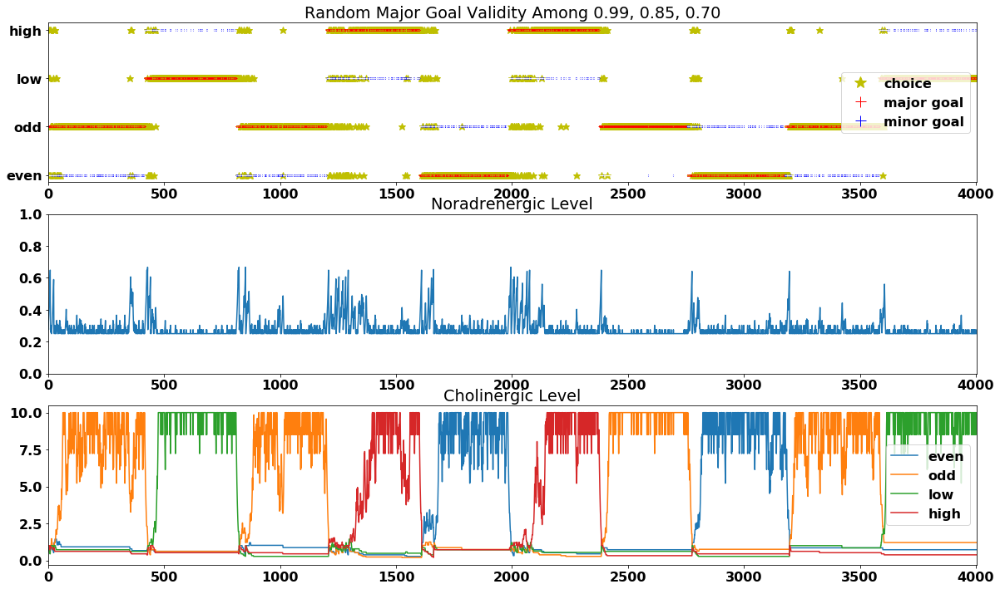

In [92]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


In [93]:
all_multia_case_probs = [all_prob_multia_1,all_prob_multia_2,all_prob_multia_3,all_prob_multia_4,all_prob_multia_5,\
                         all_prob_multia_6,all_prob_multia_7,all_prob_multia_8,all_prob_multia_9,all_prob_multia_10]
averages_multia = average_probs(all_multia_case_probs)


Average lag length is: 49
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.290357232075943, 0.7034474144391706, 0.006195353484886335, 0.0, 0.21966025480889334, 0.08983262553085186, 0.12635523357481887]


plt.plot(np.arange(len(choice)),choice,'y*',markersize=9) #'y*',markersize=8
    plt.plot(ind_cue1,correct[ind_cue1],'r+',markersize=2) #'r+',markersize=1
    plt.plot(ind_cue2,correct[ind_cue2],'b+',markersize=2) #'b+',markersize=3
    if alterValid:
        alter = np.array([crt+1 if crt%2==0 else crt-1 for crt in correct.tolist()])
        plt.plot(ind_cue1,alter[ind_cue1],'w.',markersize=0.5)#1
        plt.plot(ind_cue2,alter[ind_cue2],'y.',markersize=0.5)#1
    plt.xlim(0,len(correct))

In [94]:
print(all_prob_multia_10[1])
print(all_prob_multia_9[1])

[417 394 389 402 381 393 378 421 410 418]
[417 394 389 402 381 393 378 421 410 418]
